In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/customer-personality-analysis/marketing_campaign.csv


# <div style="color:white;display:fill;border-radius:5px;background-color:#08306B;letter-spacing:0.1px;overflow:hidden"><p style="padding:20px;color:white;overflow:hidden;margin:0;font-size:110%;text-align:center">1. Introduction</p></div>

## <b><span style='color:#08306B'>A. Problem Statement</span> </b>
Customer Personality Analysis is a detailed analysis of a company’s ideal customers. It helps a business to better understand its customers and makes it easier for them to modify products according to the specific needs, behaviors and concerns of different types of customers.

Customer personality analysis helps a business to modify its product based on its target customers from different types of customer segments. For example, instead of spending money to market a new product to every customer in the company’s database, a company can analyze which customer segment is most likely to buy the product and then market the product only on that particular segment.

## <b><span style='color:#08306B'>B. Objectives</span> </b>
1. Segment customers based on shared characteristics and behaviors.
2. Identify key customer personas and their preferences.
3. Optimize marketing campaigns by targeting specific customer segments.
4. Improve product development by aligning offerings with customer needs.

## <b><span style='color:#08306B'>C. Business Goal</span> </b>
1. Enhance understanding of existing customers.
2. Identify promising customer groups for new products or services.
3. Tailor marketing strategies and products to target specific customer segments.
4. Increase customer retention and loyalty.

## <b><span style='color:#08306B'>D. Data Overview</span> </b>

The [dataset](https://www.kaggle.com/vjchoudhary7/customer-segmentation-tutorial-in-python) consists of 2240 datapointsa and 29 attributes. It can be categorized into the following subsets :

**People :**
* ID: Customer's unique identifier
* Year_Birth: Customer's birth year
* Education: Customer's education level
* Marital_Status: Customer's marital status
* Income: Customer's yearly household income
* Kidhome: Number of children in customer's household
* Teenhome: Number of teenagers in customer's household
* Dt_Customer: Date of customer's enrollment with the company
* Recency: Number of days since customer's last purchase
* Complain: 1 if the customer complained in the last 2 years, 0 otherwise

**Products :**
* MntWines: Amount spent on wine in last 2 years
* MntFruits: Amount spent on fruits in last 2 years
* MntMeatProducts: Amount spent on meat in last 2 years
* MntFishProducts: Amount spent on fish in last 2 years
* MntSweetProducts: Amount spent on sweets in last 2 years
* MntGoldProds: Amount spent on gold in last 2 years

**Promotion :**
* NumDealsPurchases: Number of purchases made with a discount
* AcceptedCmp1: 1 if customer accepted the offer in the 1st campaign, 0 otherwise
* AcceptedCmp2: 1 if customer accepted the offer in the 2nd campaign, 0 otherwise
* AcceptedCmp3: 1 if customer accepted the offer in the 3rd campaign, 0 otherwise
* AcceptedCmp4: 1 if customer accepted the offer in the 4th campaign, 0 otherwise
* AcceptedCmp5: 1 if customer accepted the offer in the 5th campaign, 0 otherwise
* Response: 1 if customer accepted the offer in the last campaign, 0 otherwise

**Place :**
* NumWebPurchases: Number of purchases made through the company’s website
* NumCatalogPurchases: Number of purchases made using a catalogue
* NumStorePurchases: Number of purchases made directly in stores
* NumWebVisitsMonth: Number of visits to company’s website in the last month

# <div style="color:white;display:fill;border-radius:5px;background-color:#08306B;letter-spacing:0.1px;overflow:hidden"><p style="padding:20px;color:white;overflow:hidden;margin:0;font-size:110%;text-align:center">2. Importing Libraries</p></div>

In [2]:
# Import all library and packages
import numpy as np
import pandas as pd
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import statsmodels.api as sm
import warnings

from matplotlib.colors import to_rgb
from datetime import datetime

In [3]:
# Removes the limit for the number of displayed columns 
pd.set_option("display.max_columns", None)

# Suppress warnings
warnings.filterwarnings("ignore")

In [4]:
# Set color
viridis = plt.get_cmap("viridis")
green = to_rgb(viridis(0.55))

# <div style="color:white;display:fill;border-radius:5px;background-color:#08306B;letter-spacing:0.1px;overflow:hidden"><p style="padding:20px;color:white;overflow:hidden;margin:0;font-size:110%;text-align:center">3. Loading Data</p></div>

In [5]:
# Load the dataset
data = pd.read_csv("/kaggle/input/customer-personality-analysis/marketing_campaign.csv", sep="\t")
print("Number of datapoints:", len(data))
data.head().style.background_gradient(viridis)

Number of datapoints: 2240


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.000000,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.000000,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.000000,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.000000,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.000000,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


# <div style="color:white;display:fill;border-radius:5px;background-color:#08306B;letter-spacing:0.1px;overflow:hidden"><p style="padding:20px;color:white;overflow:hidden;margin:0;font-size:110%;text-align:center">4. Data Preprocessing</p></div>

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [7]:
# Rename column for equality and clarity
# Rename category product
data=data.rename(columns={"MntWines": "Wine","MntFruits":"Fruit","MntMeatProducts":"Meat","MntFishProducts":"Fish","MntSweetProducts":"Sweet","MntGoldProds":"Gold"})

# Rename other column
data=data.rename(columns={"Year_Birth": "YearBirth","Marital_Status":"MaritalStatus","Dt_Customer":"DateEnrollment","Z_CostContact":"ZCostContact","Z_Revenue":"ZRevenue","ID":"Id"})

<Figure size 1500x600 with 0 Axes>

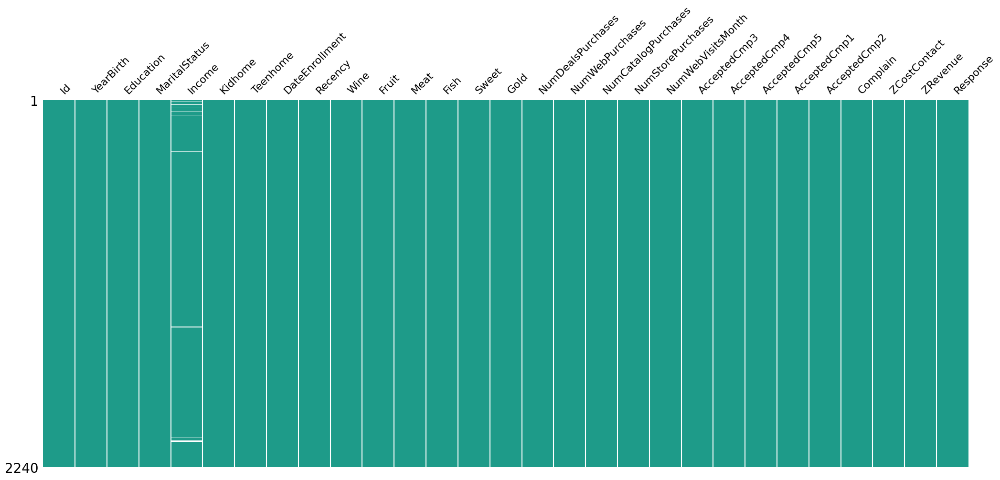

In [8]:
# Check missing values
plt.figure(figsize=(15, 6))
msno.matrix(data, sparkline=False, color=green)
plt.show()

In [9]:
# Total of missing values in each column
missing_values = data.isna().sum()

print("Total of missing values in each column:")
display(missing_values.to_frame(name="Total Missing Value").style.background_gradient(viridis))

Total of missing values in each column:


,Total Missing Value
Id,0
YearBirth,0
Education,0
MaritalStatus,0
Income,24
Kidhome,0
Teenhome,0
DateEnrollment,0
Recency,0
Wine,0


In [10]:
# Fill up the missing value in Income column
data["Income"] = data["Income"].fillna(data["Income"].median())

In [11]:
# Check the value of Marital Status column
marital_status = data["MaritalStatus"].value_counts()
display(marital_status.to_frame().style.background_gradient(viridis))

,count
MaritalStatus,
Married,864
Together,580
Single,480
Divorced,232
Widow,77
Alone,3
Absurd,2
YOLO,2


In [12]:
data.columns

Index(['Id', 'YearBirth', 'Education', 'MaritalStatus', 'Income', 'Kidhome',
       'Teenhome', 'DateEnrollment', 'Recency', 'Wine', 'Fruit', 'Meat',
       'Fish', 'Sweet', 'Gold', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'ZCostContact', 'ZRevenue', 'Response'],
      dtype='object')

In [13]:
# List of Categorical Variables
categorical = data.select_dtypes(include="object").columns
print("Categorical Variables:", categorical)

Categorical Variables: Index(['Education', 'MaritalStatus', 'DateEnrollment'], dtype='object')


In [14]:
# List of Non-Categorical Variables
non_categorical = data.select_dtypes(exclude="object").columns
print("Non-Categorical Variables:", non_categorical)

Non-Categorical Variables: Index(['Id', 'YearBirth', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'Wine',
       'Fruit', 'Meat', 'Fish', 'Sweet', 'Gold', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
       'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'ZCostContact', 'ZRevenue',
       'Response'],
      dtype='object')


In [15]:
# FEATURE ENGINEERING

# Feature : age of customer
current_year = datetime.now().year
data["Age"] = current_year-data["YearBirth"]

# Feature : number of years since the customer enrolled with the company
current_date = datetime.now()
data["DateEnrollment"] = pd.to_datetime(data["DateEnrollment"], format='%d-%m-%Y')
data["YearsEnrolled"] = (current_date - data["DateEnrollment"]).dt.days // 365

# Feature : living situation by marital status 
data["LivingWith"]=data["MaritalStatus"].replace({"Married":"Together", "Together":"Together", "Absurd":"Alone", "Widow":"Alone", "YOLO":"Alone", "Divorced":"Alone", "Single":"Alone",})

# Feature : total children living in the household
data["Children"]=data["Kidhome"]+data["Teenhome"]

# Feature : total members in the householde
data["Family"] = data["LivingWith"].replace({"Alone": 1, "Together":2})+ data["Children"]

# Feature : parenthood
data["IsParent"] = np.where(data.Children> 0, 1, 0)

# Feature : total spendings on various items
data["Spent"] = data["Wine"]+ data["Fruit"]+ data["Meat"]+ data["Fish"]+ data["Sweet"]+ data["Gold"]

Relative Plot Of Some Selected Features: A Data Subset


<Figure size 640x480 with 0 Axes>

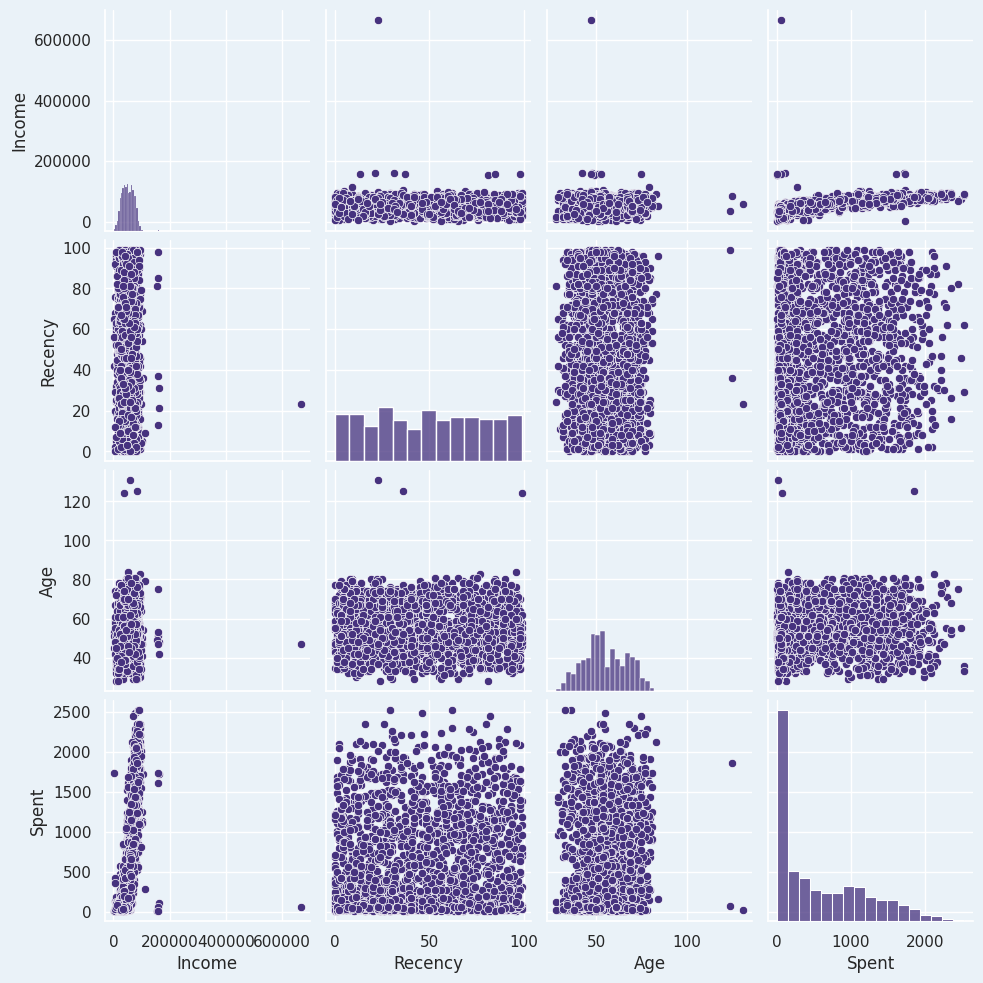

In [16]:
# Check outlier using pairplot
sns.set(rc={"axes.facecolor":"#EAF2F8", "figure.facecolor":"#EAF2F8"})
sns.set_palette("viridis")
to_plot = ["Income", "Recency", "Age", "Spent"]
print("Relative Plot Of Some Selected Features: A Data Subset")
plt.figure()
pairplot = sns.pairplot(data[to_plot])
plt.show()

In [17]:
# Drop the outliers by setting a cap on Age and income. 
data = data[(data["Age"]<90)]
data = data[(data["Income"]<200000)]
print("The total number of data-points after removing the outliers are:", len(data))

The total number of data-points after removing the outliers are: 2236


# <div style="color:white;display:fill;border-radius:5px;background-color:#08306B;letter-spacing:0.1px;overflow:hidden"><p style="padding:20px;color:white;overflow:hidden;margin:0;font-size:110%;text-align:center">5. Exploratory Data Analysis</p></div>

In [18]:
data.columns

Index(['Id', 'YearBirth', 'Education', 'MaritalStatus', 'Income', 'Kidhome',
       'Teenhome', 'DateEnrollment', 'Recency', 'Wine', 'Fruit', 'Meat',
       'Fish', 'Sweet', 'Gold', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'ZCostContact', 'ZRevenue', 'Response',
       'Age', 'YearsEnrolled', 'LivingWith', 'Children', 'Family', 'IsParent',
       'Spent'],
      dtype='object')

## <b><span style='color:#08306B'>A. Descriptive Statistics</span> </b>


In [19]:
# Descriptive Statistics
data_desc_stat = (
    data.select_dtypes(include=["number"]).drop(columns=["Id"]).describe().T.style
    .background_gradient(viridis)
    .set_caption("Descriptive Statistics of Numeric Variables")
)

data_desc_stat

,count,mean,std,min,25%,50%,75%,max
YearBirth,2236.000000,1968.898032,11.703281,1940.000000,1959.000000,1970.000000,1977.000000,1996.000000
Income,2236.000000,51952.614043,21411.466851,1730.000000,35502.500000,51381.500000,68275.750000,162397.000000
Kidhome,2236.000000,0.444097,0.538459,0.000000,0.000000,0.000000,1.000000,2.000000
Teenhome,2236.000000,0.506708,0.544609,0.000000,0.000000,0.000000,1.000000,2.000000
Recency,2236.000000,49.116279,28.957284,0.000000,24.000000,49.000000,74.000000,99.000000
Wine,2236.000000,304.127460,336.591810,0.000000,24.000000,174.000000,504.250000,1493.000000
Fruit,2236.000000,26.275939,39.724007,0.000000,1.000000,8.000000,33.000000,199.000000
Meat,2236.000000,166.983453,225.689645,0.000000,16.000000,67.000000,232.000000,1725.000000
Fish,2236.000000,37.536225,54.648562,0.000000,3.000000,12.000000,50.000000,259.000000
Sweet,2236.000000,27.080501,41.299504,0.000000,1.000000,8.000000,33.000000,263.000000


## <b><span style='color:#08306B'>B. Correlation Matrix</span> </b>


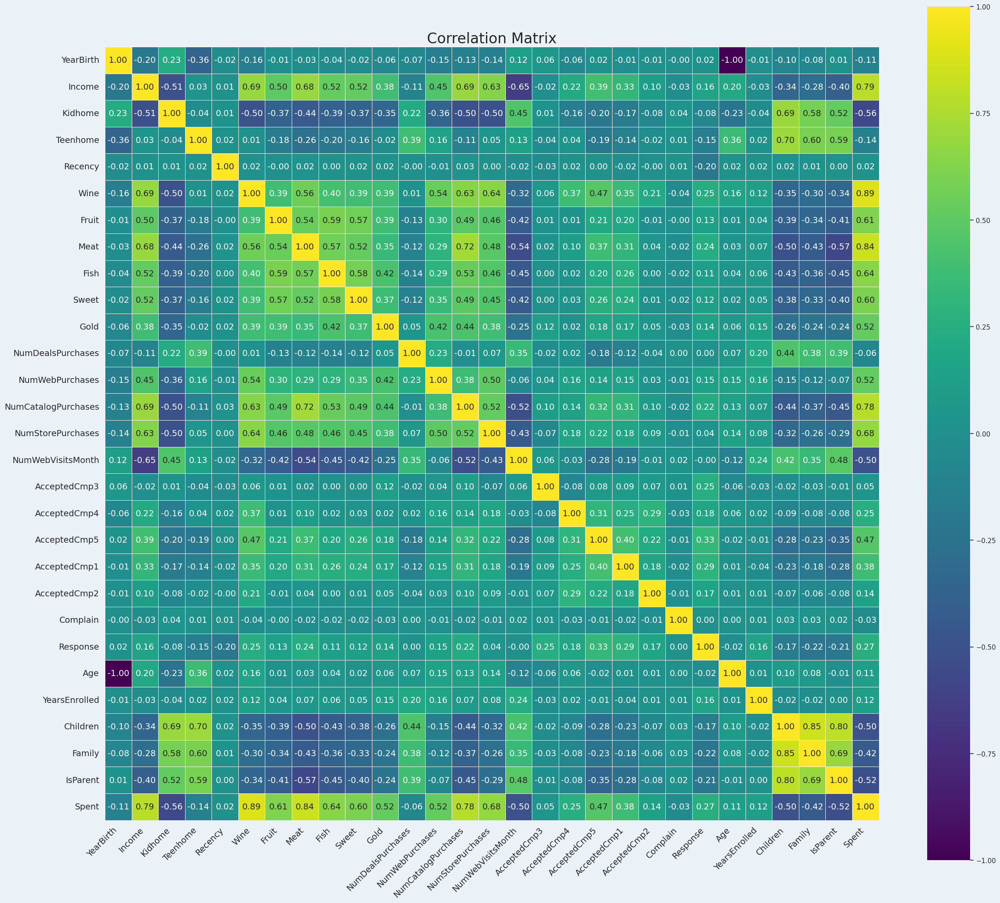

In [20]:
# Correlation matrix
corrmat = data.select_dtypes(include=["number"]).drop(columns=["Id", "ZCostContact", "ZRevenue"]).corr()
plt.figure(figsize=(25, 25))
sns.heatmap(corrmat, annot=True, cmap="viridis", center=0, fmt=".2f", linewidths=0.5, square=True, annot_kws={"size": 14}, cbar_kws={"shrink": 0.8}, vmin=-1, vmax=1)
plt.title("Correlation Matrix", fontsize=24)
plt.xticks(rotation=45, ha="right", fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.show()

## <b><span style='color:#08306B'>C. Univariate Exploration</span> </b>


## <b><span style='color:#08306B'>1) What is the age distribution of customers?</span> </b>

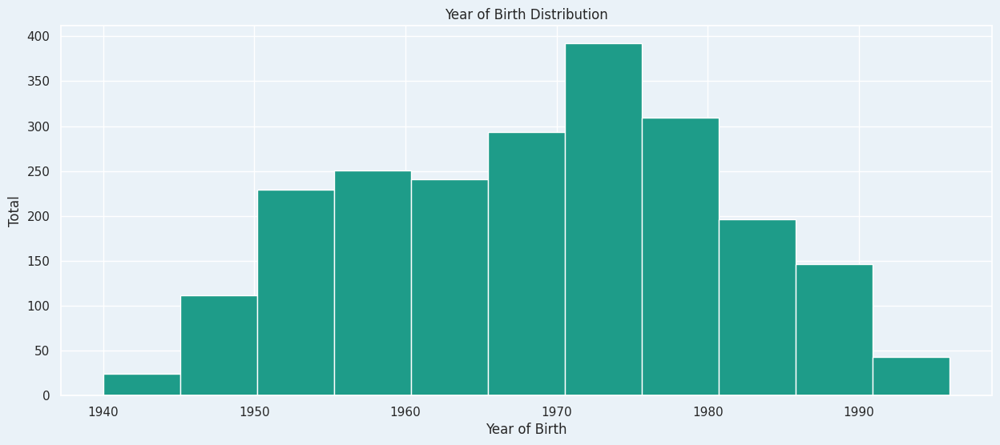

In [21]:
plt.figure(figsize=(15, 6))
data["YearBirth"].plot(kind="hist", bins=11, color=green)
plt.title("Year of Birth Distribution")
plt.xlabel("Year of Birth")
plt.ylabel("Total")
plt.show()

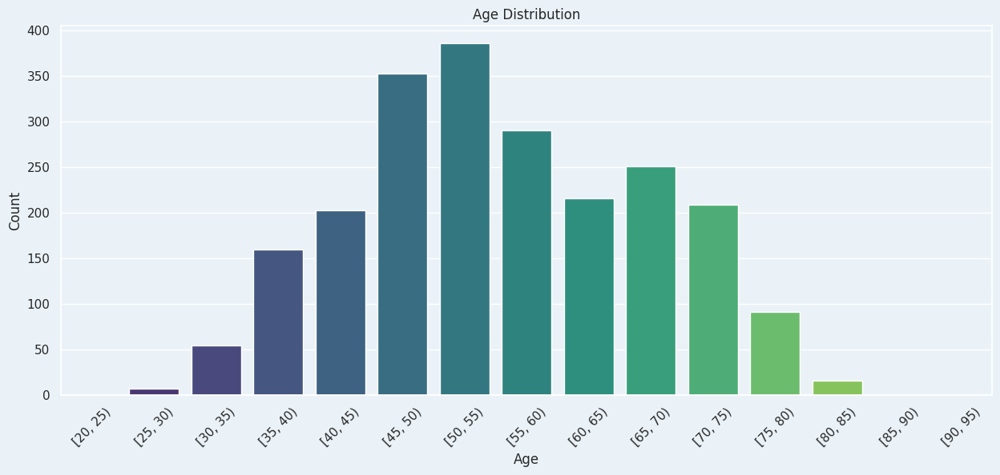

In [22]:
# Display age distribution in interval
data["Age_Binned"] = pd.cut(data["Age"], bins=range(20, 96, 5), right=False)
fig, ax = plt.subplots(figsize=(15, 6))
sns.countplot(data=data, x="Age_Binned", palette="viridis")
plt.xticks(rotation=45)
plt.xlabel("Age")
plt.ylabel("Count")
plt.title("Age Distribution")
plt.show()

## <b><span style='color:#08306B'>2) How is education level distributed among customers?</span> </b>

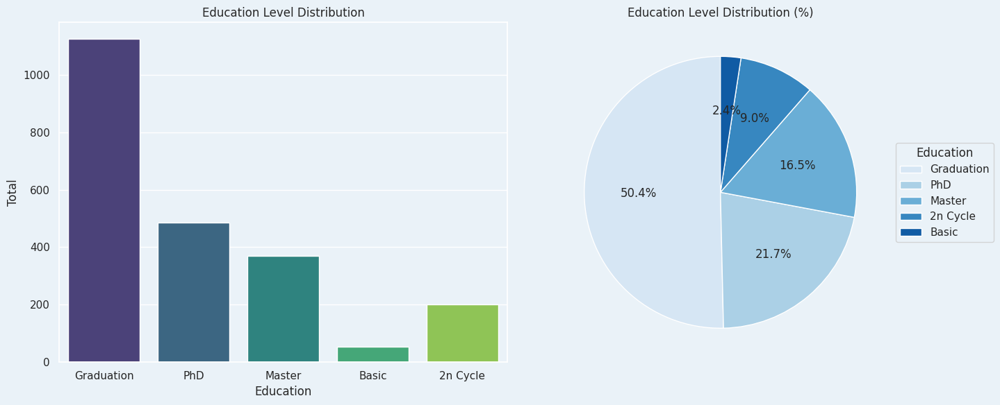

In [23]:
# Value counts and percentage
education_counts = data["Education"].value_counts()

# Create a figure with 2 subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Bar Chart 
sns.countplot(data=data, x="Education", ax=ax1, palette="viridis")
ax1.set_title("Education Level Distribution")
ax1.set_xlabel("Education")
ax1.set_ylabel("Total")
ax1.tick_params(axis="x", rotation=0)

# Pie Chart
wedges, texts, autotexts = ax2.pie(
    education_counts,
    autopct="%1.1f%%",  # Show percentage on the pie chart slices
    startangle=90,
    colors=sns.color_palette("Blues", len(education_counts))
)
ax2.set_title("Education Level Distribution (%)")

# Add legend outside the pie chart
ax2.legend(
    wedges,
    education_counts.index,
    title="Education",
    loc="center left",
    bbox_to_anchor=(1, 0, 0.5, 1)
)

# Display plot
plt.tight_layout()
plt.show()

## <b><span style='color:#08306B'>3) How is distribution of marital status among customers?</span> </b>


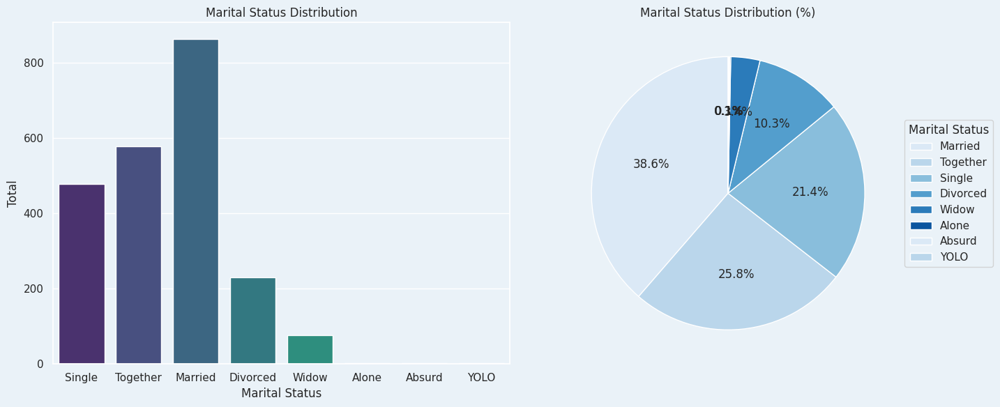

In [24]:
# Value counts and percentage
marital_counts = data["MaritalStatus"].value_counts()

# Create a figure with 2 subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Bar Chart 
sns.countplot(data=data, x="MaritalStatus", ax=ax1, palette="viridis")
ax1.set_title("Marital Status Distribution")
ax1.set_xlabel("Marital Status")
ax1.set_ylabel("Total")
ax1.tick_params(axis="x", rotation=0)

# Pie Chart
wedges, texts, autotexts = ax2.pie(
    marital_counts,
    autopct="%1.1f%%",  # Show percentage on the pie chart slices
    startangle=90,
    colors=sns.color_palette("Blues")
)
ax2.set_title("Marital Status Distribution (%)")

# Add legend outside the pie chart
ax2.legend(
    wedges,
    marital_counts.index,
    title="Marital Status",
    loc="center left",
    bbox_to_anchor=(1, 0, 0.5, 1)
)

# Display plot
plt.tight_layout()
plt.show()

## <b><span style='color:#08306B'>4) What is the distribution of customers based on their living situation?</span> </b>

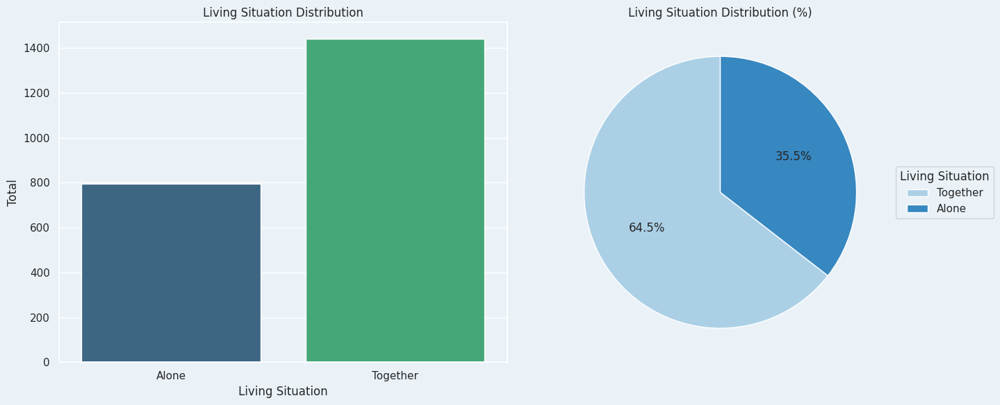

In [25]:
# Value counts and percentage
living_with_counts = data["LivingWith"].value_counts()

# Create a figure with 2 subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Bar Chart 
sns.countplot(data=data, x="LivingWith", ax=ax1, palette="viridis")
ax1.set_title("Living Situation Distribution")
ax1.set_xlabel("Living Situation")
ax1.set_ylabel("Total")
ax1.tick_params(axis="x", rotation=0)

# Pie Chart
wedges, texts, autotexts = ax2.pie(
    living_with_counts,
    autopct="%1.1f%%",  # Show percentage on the pie chart slices
    startangle=90,
    colors=sns.color_palette("Blues", len(living_with_counts))
)
ax2.set_title("Living Situation Distribution (%)")

# Add legend outside the pie chart
ax2.legend(
    wedges,
    living_with_counts.index,
    title="Living Situation",
    loc="center left",
    bbox_to_anchor=(1, 0, 0.5, 1)
)

# Display plot
plt.tight_layout()
plt.show()

## <b><span style='color:#08306B'>5) How many customers have children or teenagers at home?</span> </b>

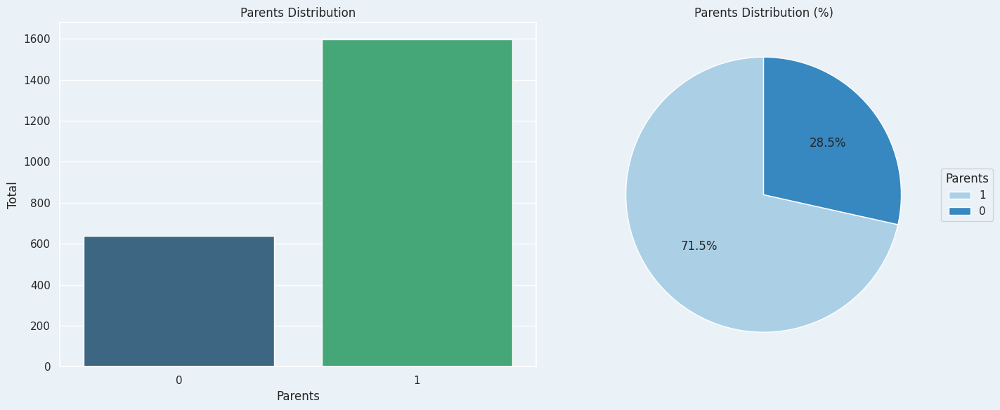

In [26]:
# Value counts and percentage
is_parent_counts = data["IsParent"].value_counts()

# Create a figure with 2 subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Bar Chart 
sns.countplot(data=data, x="IsParent", ax=ax1, palette="viridis")
ax1.set_title("Parents Distribution")
ax1.set_xlabel("Parents")
ax1.set_ylabel("Total")
ax1.tick_params(axis="x", rotation=0)

# Pie Chart
wedges, texts, autotexts = ax2.pie(
    is_parent_counts,
    autopct="%1.1f%%",  # Show percentage on the pie chart slices
    startangle=90,
    colors=sns.color_palette("Blues", len(is_parent_counts))
)
ax2.set_title("Parents Distribution (%)")

# Add legend outside the pie chart
ax2.legend(
    wedges,
    is_parent_counts.index,
    title="Parents",
    loc="center left",
    bbox_to_anchor=(1, 0, 0.5, 1)
)

# Display plot
plt.tight_layout()
plt.show()

## <b><span style='color:#08306B'>6) What is the distribution of the number of children (Kidhome and Teenhome)?</span> </b>

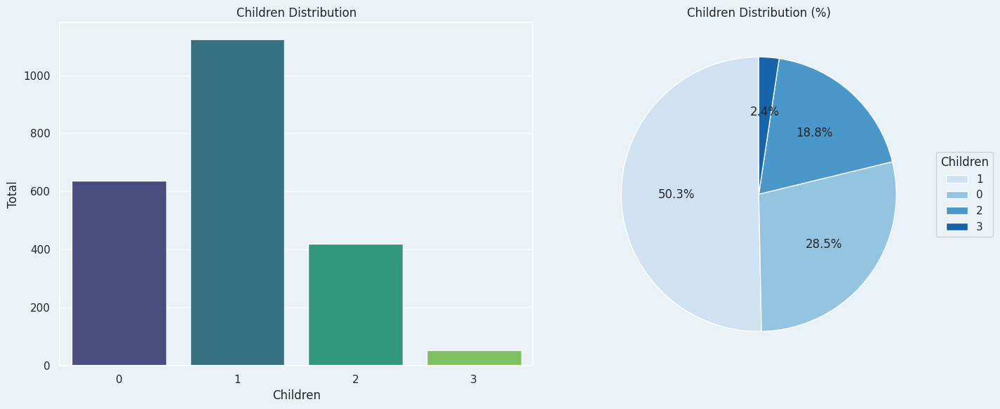

In [27]:
# Value counts and percentage
children_counts = data["Children"].value_counts()

# Create a figure with 2 subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Bar Chart 
sns.countplot(data=data, x="Children", ax=ax1, palette="viridis")
ax1.set_title("Children Distribution")
ax1.set_xlabel("Children")
ax1.set_ylabel("Total")
ax1.tick_params(axis="x", rotation=0)

# Pie Chart
wedges, texts, autotexts = ax2.pie(
    children_counts,
    autopct="%1.1f%%",  # Show percentage on the pie chart slices
    startangle=90,
    colors=sns.color_palette("Blues", len(children_counts))
)
ax2.set_title("Children Distribution (%)")

# Add legend outside the pie chart
ax2.legend(
    wedges,
    children_counts.index,
    title="Children",
    loc="center left",
    bbox_to_anchor=(1, 0, 0.5, 1)
)

# Display plot
plt.tight_layout()
plt.show()

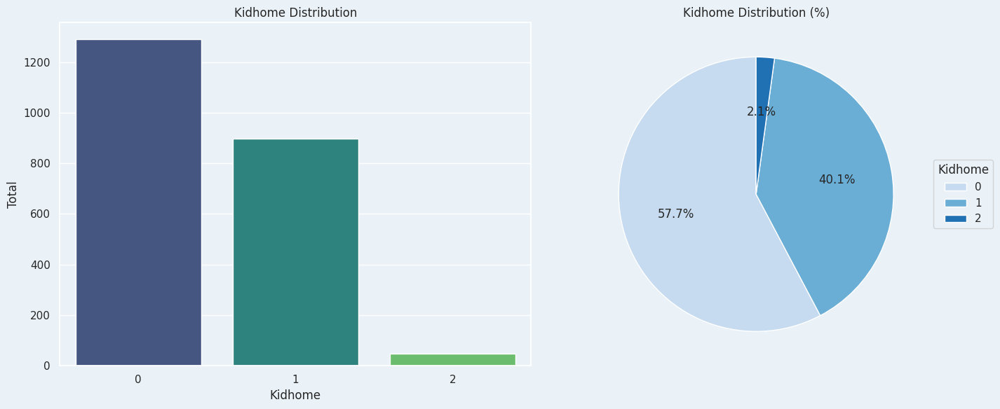

In [28]:
# Value counts and percentage
kidhome_counts = data["Kidhome"].value_counts()

# Create a figure with 2 subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Bar Chart 
sns.countplot(data=data, x="Kidhome", ax=ax1, palette="viridis")
ax1.set_title("Kidhome Distribution")
ax1.set_xlabel("Kidhome")
ax1.set_ylabel("Total")
ax1.tick_params(axis="x", rotation=0)

# Pie Chart
wedges, texts, autotexts = ax2.pie(
    kidhome_counts,
    autopct="%1.1f%%",  # Show percentage on the pie chart slices
    startangle=90,
    colors=sns.color_palette("Blues", len(kidhome_counts))
)
ax2.set_title("Kidhome Distribution (%)")

# Add legend outside the pie chart
ax2.legend(
    wedges,
    kidhome_counts.index,
    title="Kidhome",
    loc="center left",
    bbox_to_anchor=(1, 0, 0.5, 1)
)

# Display plot
plt.tight_layout()
plt.show()

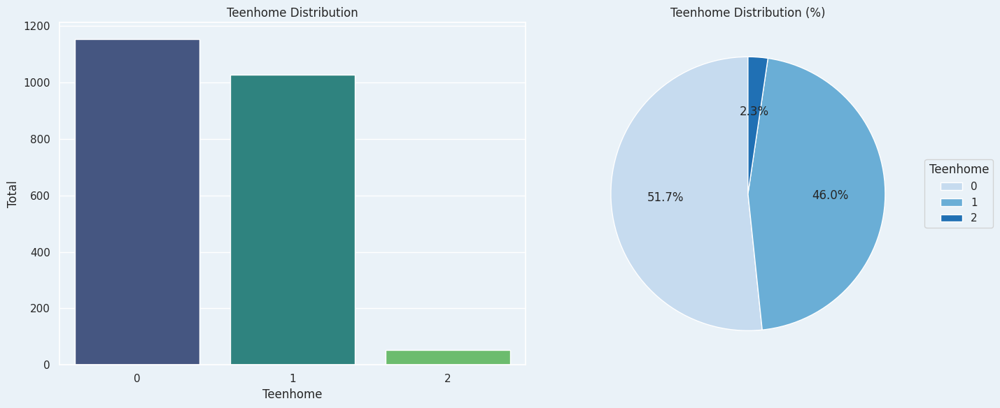

In [29]:
# Value counts and percentage
teenhome_counts = data["Teenhome"].value_counts()

# Create a figure with 2 subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Bar Chart 
sns.countplot(data=data, x="Teenhome", ax=ax1, palette="viridis")
ax1.set_title("Teenhome Distribution")
ax1.set_xlabel("Teenhome")
ax1.set_ylabel("Total")
ax1.tick_params(axis="x", rotation=0)

# Pie Chart
wedges, texts, autotexts = ax2.pie(
    teenhome_counts,
    autopct="%1.1f%%",  # Show percentage on the pie chart slices
    startangle=90,
    colors=sns.color_palette("Blues", len(teenhome_counts))
)
ax2.set_title("Teenhome Distribution (%)")

# Add legend outside the pie chart
ax2.legend(
    wedges,
    teenhome_counts.index,
    title="Teenhome",
    loc="center left",
    bbox_to_anchor=(1, 0, 0.5, 1)
)

# Display plot
plt.tight_layout()
plt.show()

## <b><span style='color:#08306B'>7) Which product category has the highest purchase?</span> </b>

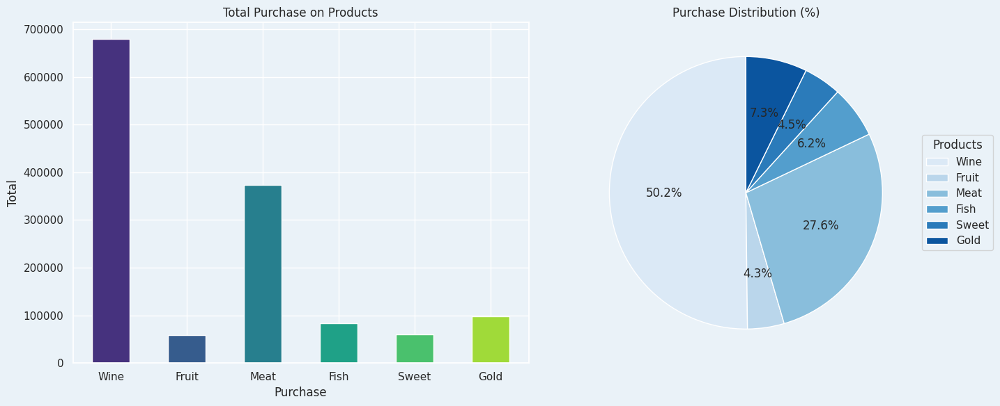

In [30]:
# Columns to plot
columns_to_plot = ["Wine", "Fruit", "Meat", "Fish", "Sweet", "Gold"]
total_spent = data[columns_to_plot].sum()

# Create a figure with 1 row and 2 columns
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Bar Chart
total_spent.plot(kind="bar", color=sns.color_palette("viridis", len(columns_to_plot)), ax=ax1)
ax1.set_title("Total Purchase on Products")
ax1.set_xlabel("Purchase")
ax1.set_ylabel("Total")
ax1.set_xticklabels(total_spent.index, rotation=0)

# Pie Chart
wedges, texts, autotexts = ax2.pie(
    total_spent,
    autopct="%1.1f%%",  # Show percentage on the pie chart slices
    startangle=90,
    colors=sns.color_palette("Blues", len(total_spent))
)
ax2.set_title("Purchase Distribution (%)")

# Add legend outside the pie chart
ax2.legend(
    wedges,
    total_spent.index,
    title="Products",
    loc="center left",
    bbox_to_anchor=(1, 0, 0.5, 1)
)

# Adjust layout
plt.tight_layout()
plt.show()

## <b><span style='color:#08306B'>8) How is the income distribution of customers?</span> </b>

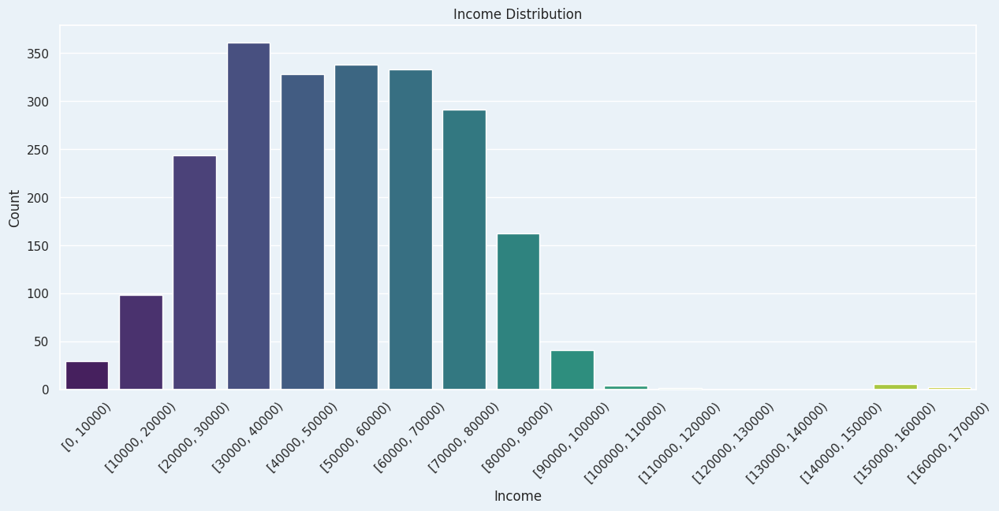

In [31]:
# Display income distribution in interval
data["Income_Binned"] = pd.cut(data["Income"], bins=range(0, 180000, 10000), right=False)
fig, ax = plt.subplots(figsize=(15, 6))
sns.countplot(data=data, x="Income_Binned", palette="viridis")
plt.xticks(rotation=45)
plt.xlabel("Income")
plt.ylabel("Count")
plt.title("Income Distribution")
plt.show()

## <b><span style='color:#08306B'>9) What is the preferred purchasing channel among customers (web, catalog, or store)?</span> </b>

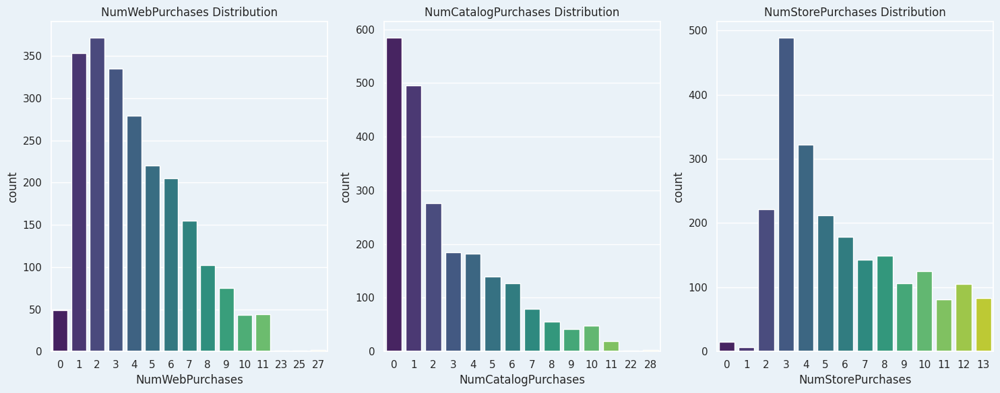

In [32]:
# Number of purchases distribution
columns_to_plot = ["NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases"]

# Make subplot
fig, ax = plt.subplots(1, len(columns_to_plot), figsize=(15, 6))

for i, col in enumerate(columns_to_plot):
    sns.countplot(data=data, x=col, ax=ax[i], palette="viridis")
    ax[i].set_title(f"{col} Distribution")
    ax[i].tick_params(axis="x")

plt.tight_layout()
plt.show()

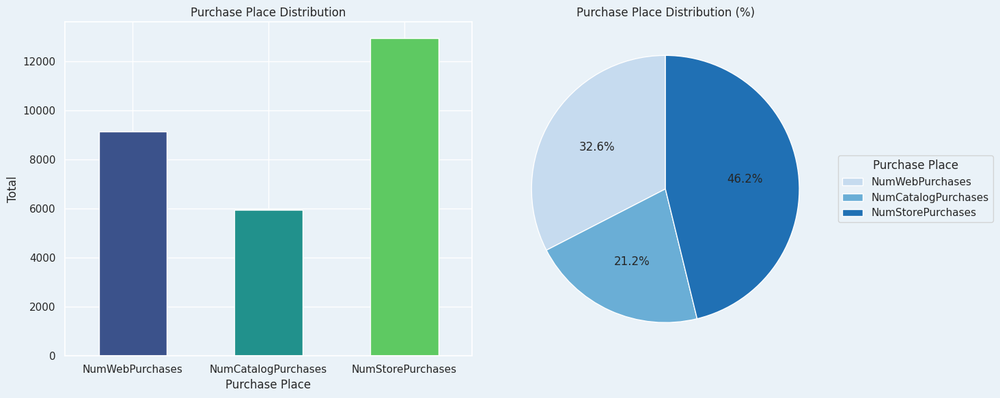

In [33]:
# Columns to plot
columns_to_plot = ["NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases"]
total_spent = data[columns_to_plot].sum()

# Create a figure with 1 row and 2 columns
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Bar Chart
total_spent.plot(kind="bar", color=sns.color_palette("viridis", len(columns_to_plot)), ax=ax1)
ax1.set_title("Purchase Place Distribution")
ax1.set_xlabel("Purchase Place")
ax1.set_ylabel("Total")
ax1.set_xticklabels(total_spent.index, rotation=0)

# Pie Chart
wedges, texts, autotexts = ax2.pie(
    total_spent,
    autopct="%1.1f%%",  # Show percentage on the pie chart slices
    startangle=90,
    colors=sns.color_palette("Blues", len(total_spent))
)
ax2.set_title("Purchase Place Distribution (%)")

# Add legend outside the pie chart
ax2.legend(
    wedges,
    total_spent.index,
    title="Purchase Place",
    loc="center left",
    bbox_to_anchor=(1, 0, 0.5, 1)
)

# Adjust layout
plt.tight_layout()
plt.show()

## <b><span style='color:#08306B'>10) Is the rate of purchasing online different from purchasing in stores?</span> </b>

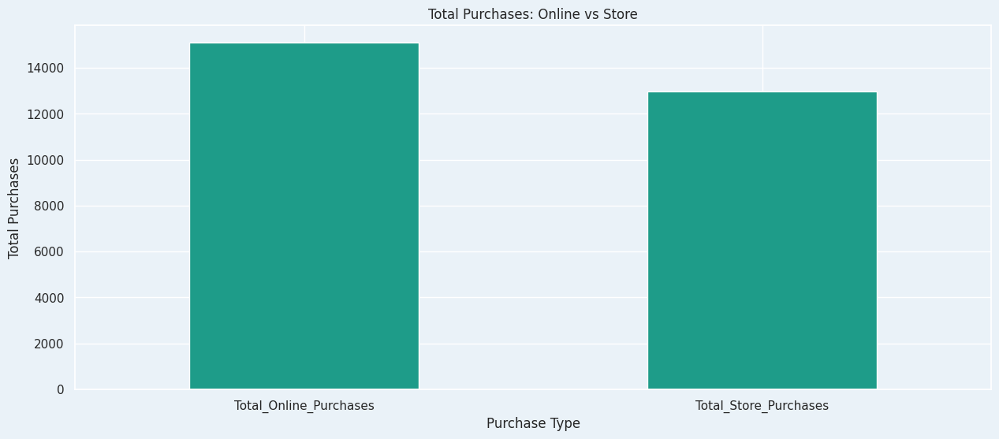

In [34]:
data["Total_Online_Purchases"] = data["NumWebPurchases"] + data["NumCatalogPurchases"]
data["Total_Store_Purchases"] = data["NumStorePurchases"]

online_vs_store = data[["Total_Online_Purchases", "Total_Store_Purchases"]].sum()
plt.figure(figsize=(15,6))
online_vs_store.plot(kind="bar", color=green)
plt.xticks(rotation=0)
plt.title("Total Purchases: Online vs Store")
plt.xlabel("Purchase Type")
plt.ylabel("Total Purchases")
plt.show()

## <b><span style='color:#08306B'>11) What is the length of time customers have been enrolled?</span> </b>

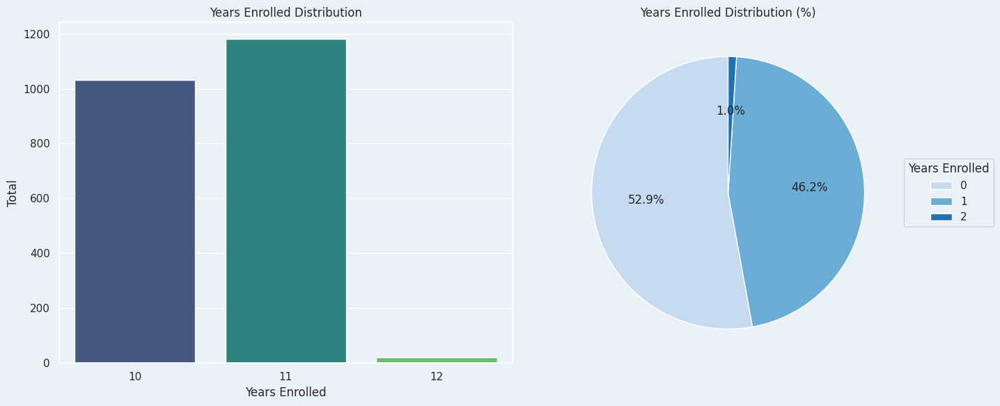

In [35]:
# Value counts and percentage
years_enrolled_counts = data["YearsEnrolled"].value_counts()

# Create a figure with 2 subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Bar Chart 
sns.countplot(data=data, x="YearsEnrolled", ax=ax1, palette="viridis")
ax1.set_title("Years Enrolled Distribution")
ax1.set_xlabel("Years Enrolled")
ax1.set_ylabel("Total")
ax1.tick_params(axis="x", rotation=0)

# Pie Chart
wedges, texts, autotexts = ax2.pie(
    years_enrolled_counts,
    autopct="%1.1f%%",  # Show percentage on the pie chart slices
    startangle=90,
    colors=sns.color_palette("Blues", len(years_enrolled_counts))
)
ax2.set_title("Years Enrolled Distribution (%)")

# Add legend outside the pie chart
ax2.legend(
    wedges,
    teenhome_counts.index,
    title="Years Enrolled",
    loc="center left",
    bbox_to_anchor=(1, 0, 0.5, 1)
)

# Display plot
plt.tight_layout()
plt.show()

## <b><span style='color:#08306B'>12) How many customers accepted each marketing campaign? </span> </b>

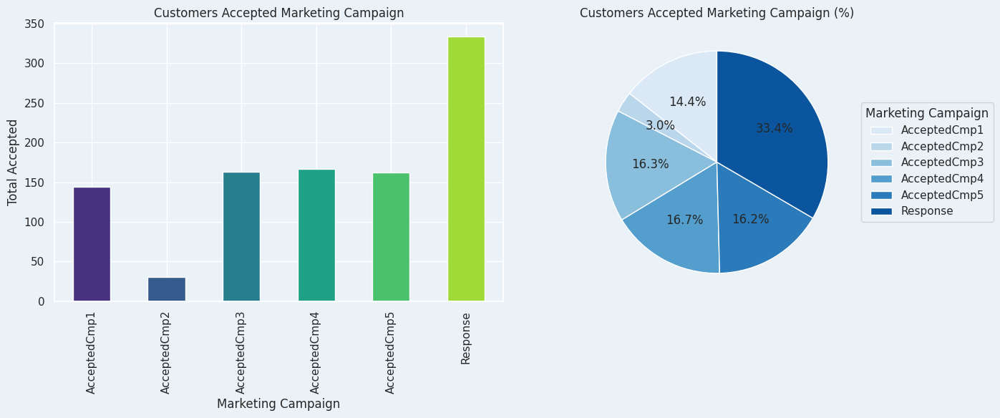

In [36]:
# Columns to plot
columns_to_plot = ["AcceptedCmp1", "AcceptedCmp2", "AcceptedCmp3", "AcceptedCmp4", "AcceptedCmp5", "Response"]
total_accept = data[columns_to_plot].sum()

# Create a figure with 1 row and 2 columns
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Bar Chart
total_accept.plot(kind="bar", color=sns.color_palette("viridis", len(columns_to_plot)), ax=ax1)
ax1.set_title("Customers Accepted Marketing Campaign")
ax1.set_xlabel("Marketing Campaign")
ax1.set_ylabel("Total Accepted")
ax1.set_xticklabels(total_accept.index, rotation=90)

# Pie Chart
wedges, texts, autotexts = ax2.pie(
    total_accept,
    autopct="%1.1f%%",  # Show percentage on the pie chart slices
    startangle=90,
    colors=sns.color_palette("Blues", len(total_accept))
)
ax2.set_title("Customers Accepted Marketing Campaign (%)")

# Add legend outside the pie chart
ax2.legend(
    wedges,
    total_accept.index,
    title="Marketing Campaign",
    loc="center left",
    bbox_to_anchor=(1, 0, 0.5, 1)
)

# Adjust layout
plt.tight_layout()
plt.show()

## <b><span style='color:#08306B'>13) What percentage of customers have filed a complaint?</span> </b>

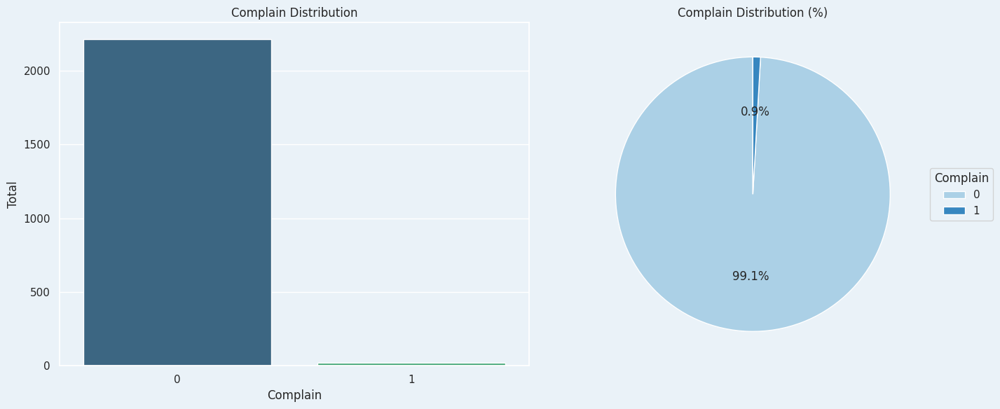

In [37]:
# Value counts and percentage
complain_counts = data["Complain"].value_counts()

# Create a figure with 2 subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Bar Chart 
sns.countplot(data=data, x="Complain", ax=ax1, palette="viridis")
ax1.set_title("Complain Distribution")
ax1.set_xlabel("Complain")
ax1.set_ylabel("Total")
ax1.tick_params(axis="x", rotation=0)

# Pie Chart
wedges, texts, autotexts = ax2.pie(
    complain_counts,
    autopct="%1.1f%%",  # Show percentage on the pie chart slices
    startangle=90,
    colors=sns.color_palette("Blues", len(complain_counts))
)
ax2.set_title("Complain Distribution (%)")

# Add legend outside the pie chart
ax2.legend(
    wedges,
    kidhome_counts.index,
    title="Complain",
    loc="center left",
    bbox_to_anchor=(1, 0, 0.5, 1)
)

# Display plot
plt.tight_layout()
plt.show()

## <b><span style='color:#08306B'>14) How is the recency of purchases distributed among customers?</span> </b>

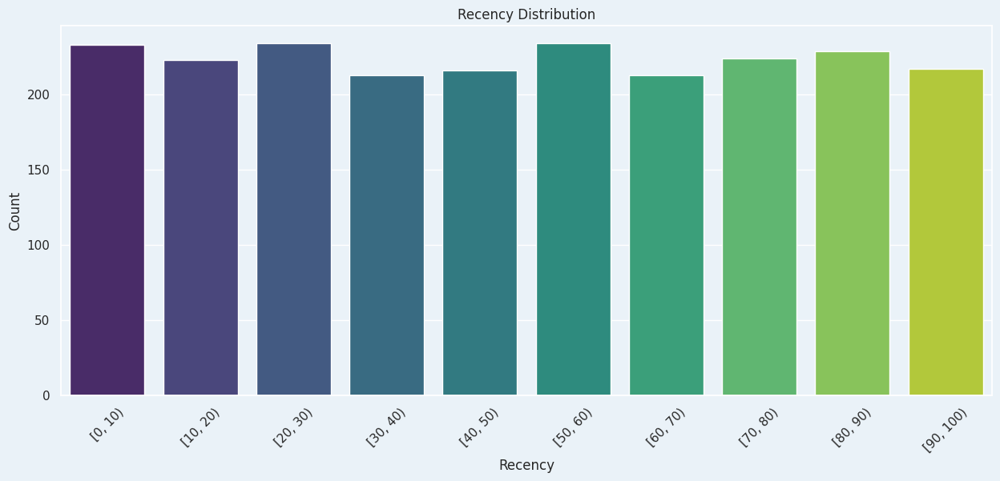

In [38]:
data["Recency_Binned"] = pd.cut(data["Recency"], bins=range(0, 101, 10), right=False)
fig, ax = plt.subplots(figsize=(15, 6))
sns.countplot(data=data, x="Recency_Binned", palette="viridis")
plt.xticks(rotation=45)
plt.xlabel("Recency")
plt.ylabel("Count")
plt.title("Recency Distribution")
plt.show()

## <b><span style='color:#08306B'>D. Bivariate Exploration</span> </b>

## <b><span style='color:#08306B'>1) How is Income distributed by Age?</span> </b>


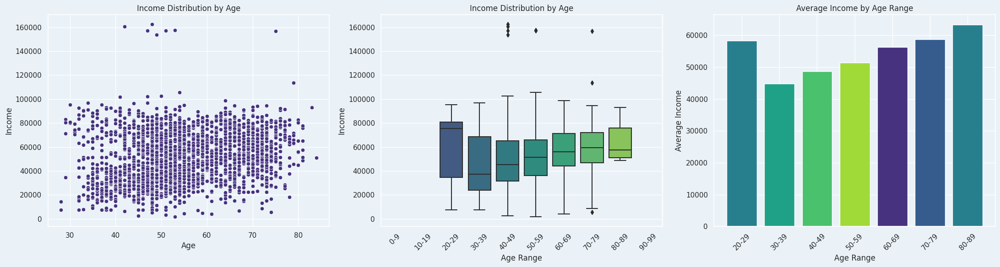

In [39]:
# Create age bins for better visualization
data["AgeBins"] = pd.cut(data["Age"], bins=range(0, 101, 10), labels=[f"{i}-{i+9}" for i in range(0, 100, 10)])

# Set up the matplotlib figure
fig, axes = plt.subplots(1, 3, figsize=(22, 6))

# Scatter Plot
sns.scatterplot(x="Age", y="Income", data=data, palette="viridis", ax=axes[0])
axes[0].set_title("Income Distribution by Age")
axes[0].set_xlabel("Age")
axes[0].set_ylabel("Income")

# Box Plot
sns.boxplot(x="AgeBins", y="Income", data=data, palette="viridis", ax=axes[1])
axes[1].set_title("Income Distribution by Age")
axes[1].set_xlabel("Age Range")
axes[1].set_ylabel("Income")
axes[1].tick_params(axis='x', rotation=45)

# Histogram
# Group data by age bins and calculate average income
hist_data = data.groupby('AgeBins')['Income'].mean().reset_index()
axes[2].bar(hist_data['AgeBins'], hist_data['Income'], color=sns.color_palette("viridis"))
axes[2].set_title("Average Income by Age Range")
axes[2].set_xlabel("Age Range")
axes[2].set_ylabel("Average Income")
axes[2].tick_params(axis='x', rotation=45)

# Adjust layout
plt.tight_layout()
plt.show()

## <b><span style='color:#08306B'>2) What is the distribution of Total Spending by Marital Status?</span> </b>

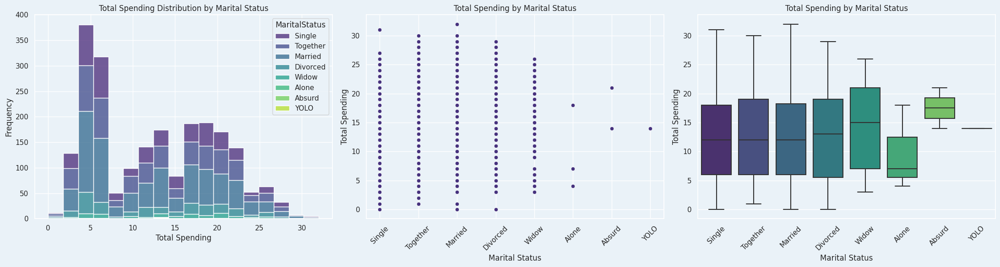

In [40]:
# Calculate total spending
data["TotalSpending"] = data["NumWebPurchases"] + data["NumCatalogPurchases"] + data["NumStorePurchases"]

# Create figure and axes
fig, axes = plt.subplots(1, 3, figsize=(22, 6))

# Histogram
sns.histplot(data=data, x="TotalSpending", hue="MaritalStatus", multiple="stack", palette="viridis", ax=axes[0])
axes[0].set_title("Total Spending Distribution by Marital Status")
axes[0].set_xlabel("Total Spending")
axes[0].set_ylabel("Frequency")

# Scatter Plot
sns.scatterplot(x="MaritalStatus", y="TotalSpending", data=data, palette="viridis", ax=axes[1])
axes[1].set_title("Total Spending by Marital Status")
axes[1].set_xlabel("Marital Status")
axes[1].set_ylabel("Total Spending")
axes[1].tick_params(axis='x', rotation=45)

# Box Plot
sns.boxplot(x="MaritalStatus", y="TotalSpending", data=data, palette="viridis", ax=axes[2])
axes[2].set_title("Total Spending by Marital Status")
axes[2].set_xlabel("Marital Status")
axes[2].set_ylabel("Total Spending")
axes[2].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

## <b><span style='color:#08306B'>3) How does Income vary by Education level?</span> </b>

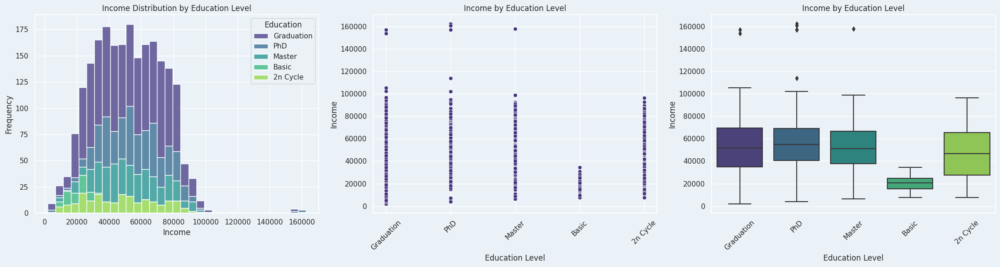

In [41]:
# Create figure and axes
fig, axes = plt.subplots(1, 3, figsize=(22, 6))

# Histogram
sns.histplot(data=data, x="Income", hue="Education", multiple="stack", palette="viridis", ax=axes[0])
axes[0].set_title("Income Distribution by Education Level")
axes[0].set_xlabel("Income")
axes[0].set_ylabel("Frequency")

# Scatter Plot
sns.scatterplot(x="Education", y="Income", data=data, palette="viridis", ax=axes[1])
axes[1].set_title("Income by Education Level")
axes[1].set_xlabel("Education Level")
axes[1].set_ylabel("Income")
axes[1].tick_params(axis='x', rotation=45)

# Box Plot
sns.boxplot(x="Education", y="Income", data=data, palette="viridis", ax=axes[2])
axes[2].set_title("Income by Education Level")
axes[2].set_xlabel("Education Level")
axes[2].set_ylabel("Income")
axes[2].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

## <b><span style='color:#08306B'>4) How does Online Purchase vary by Age?</span> </b>

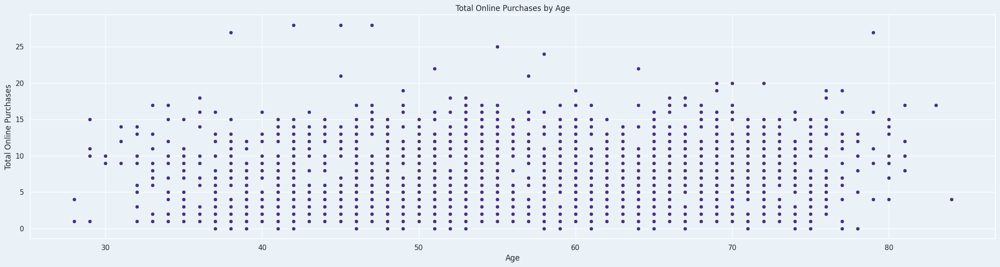

In [42]:
# Calculate total online purchases
data["TotalOnlinePurchases"] = data["NumWebPurchases"] + data["NumCatalogPurchases"]

# Create figure and axes
fig, axes = plt.subplots(figsize=(22, 6))

# Scatter Plot
sns.scatterplot(x="Age", y="TotalOnlinePurchases", data=data, palette="viridis")
axes.set_title("Total Online Purchases by Age")
axes.set_xlabel("Age")
axes.set_ylabel("Total Online Purchases")

plt.tight_layout()
plt.show()


## <b><span style='color:#08306B'>5) How does Offline Purchase vary by Age?</span> </b>

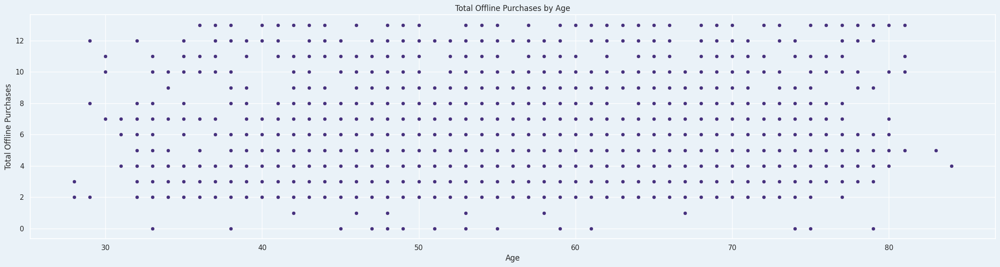

In [43]:
# Calculate total offline purchases
data["TotalOfflinePurchases"] = data["NumStorePurchases"]

# Create figure and axes
fig, axes = plt.subplots(figsize=(22, 6))

# Scatter Plot
sns.scatterplot(x="Age", y="TotalOfflinePurchases", data=data, palette="viridis")
axes.set_title("Total Offline Purchases by Age")
axes.set_xlabel("Age")
axes.set_ylabel("Total Offline Purchases")

plt.tight_layout()
plt.show()

## <b><span style='color:#08306B'>6) What is the distribution of Spent by LivingWith status?</span> </b>

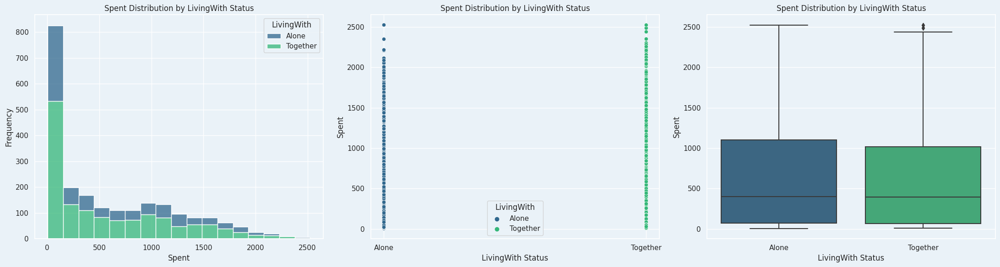

In [44]:
# Set up the matplotlib figure
fig, axes = plt.subplots(1, 3, figsize=(22, 6))

# Histogram
sns.histplot(data=data, x="Spent", hue="LivingWith", palette="viridis", ax=axes[0], multiple="stack")
axes[0].set_title("Spent Distribution by LivingWith Status")
axes[0].set_xlabel("Spent")
axes[0].set_ylabel("Frequency")

# Scatter Plot
sns.scatterplot(x="LivingWith", y="Spent", data=data, hue="LivingWith", palette="viridis", ax=axes[1])
axes[1].set_title("Spent Distribution by LivingWith Status")
axes[1].set_xlabel("LivingWith Status")
axes[1].set_ylabel("Spent")

# Box Plot
sns.boxplot(x="LivingWith", y="Spent", data=data, palette="viridis", ax=axes[2])
axes[2].set_title("Spent Distribution by LivingWith Status")
axes[2].set_xlabel("LivingWith Status")
axes[2].set_ylabel("Spent")

# Adjust layout
plt.tight_layout()
plt.show()

## <b><span style='color:#08306B'>7) How does Recency relate to NumDealsPurchases?</span> </b>

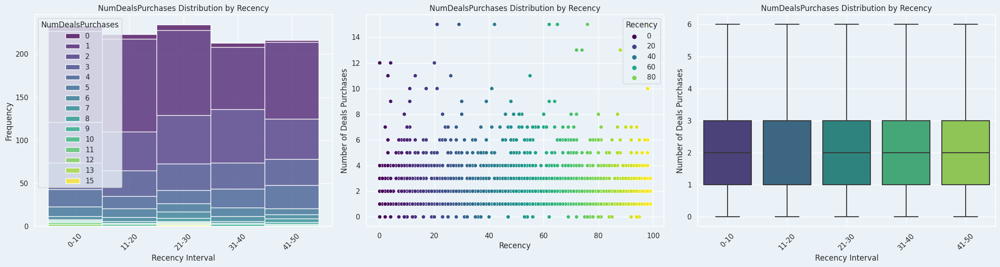

In [45]:
# Make Interval for recency
bins = [0, 10, 20, 30, 40, 50]
labels = ["0-10", "11-20", "21-30", "31-40", "41-50"]
data["RecencyInterval"] = pd.cut(data["Recency"], bins=bins, labels=labels, right=False)

# Set up the matplotlib figure
fig, axes = plt.subplots(1, 3, figsize=(22, 6))

# Histogram 
sns.histplot(data=data, x="RecencyInterval", hue="NumDealsPurchases", palette="viridis", ax=axes[0], multiple="stack")
axes[0].set_title("NumDealsPurchases Distribution by Recency")
axes[0].set_xlabel("Recency Interval")
axes[0].set_ylabel("Frequency")
axes[0].tick_params(axis="x", rotation=45)
axes[0].grid(True)

# Scatter Plot
sns.scatterplot(x="Recency", y="NumDealsPurchases", data=data, hue="Recency", palette="viridis", ax=axes[1])
axes[1].set_title("NumDealsPurchases Distribution by Recency")
axes[1].set_xlabel("Recency")
axes[1].set_ylabel("Number of Deals Purchases")
axes[1].grid(True)

# Box Plot
sns.boxplot(x="RecencyInterval", y="NumDealsPurchases", data=data, palette="viridis", ax=axes[2], whis=1.5, showfliers=False)
axes[2].set_title("NumDealsPurchases Distribution by Recency")
axes[2].set_xlabel("Recency Interval")
axes[2].set_ylabel("Number of Deals Purchases")
axes[2].tick_params(axis="x", rotation=45)
axes[2].grid(True)

# Adjust layout
plt.tight_layout()
plt.show()


## <b><span style='color:#08306B'>8) How does IsParent vary with TotalSpending?</span> </b>

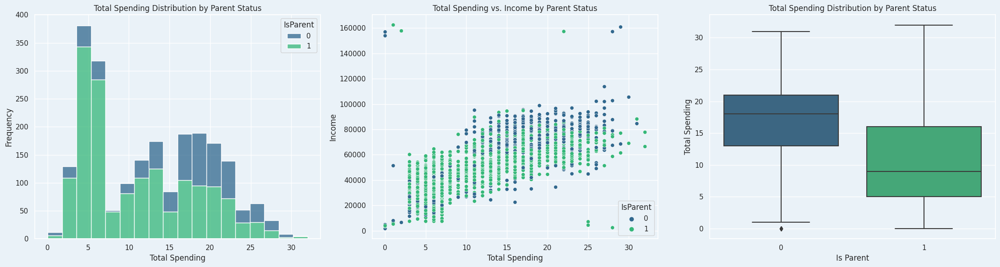

In [46]:
# Set up the matplotlib figure
fig, axes = plt.subplots(1, 3, figsize=(22, 6))

# Histogram
sns.histplot(data=data, x="TotalSpending", hue="IsParent", palette="viridis", ax=axes[0], multiple="stack")
axes[0].set_title("Total Spending Distribution by Parent Status")
axes[0].set_xlabel("Total Spending")
axes[0].set_ylabel("Frequency")

# Scatter Plot
sns.scatterplot(x="TotalSpending", y="Income", data=data, hue="IsParent", palette="viridis", ax=axes[1])
axes[1].set_title("Total Spending vs. Income by Parent Status")
axes[1].set_xlabel("Total Spending")
axes[1].set_ylabel("Income")

# Box Plot
sns.boxplot(x="IsParent", y="TotalSpending", data=data, palette="viridis", ax=axes[2])
axes[2].set_title("Total Spending Distribution by Parent Status")
axes[2].set_xlabel("Is Parent")
axes[2].set_ylabel("Total Spending")

# Adjust layout
plt.tight_layout()
plt.show()

## <b><span style='color:#08306B'>9) What is the distribution of Children by MaritalStatus?</span> </b>

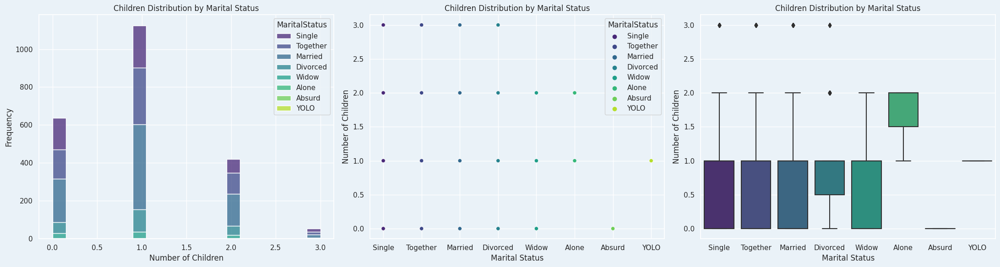

In [47]:
# Set up the matplotlib figure
fig, axes = plt.subplots(1, 3, figsize=(22, 6))

# Histogram
sns.histplot(data=data, x="Children", hue="MaritalStatus", palette="viridis", ax=axes[0], multiple="stack")
axes[0].set_title("Children Distribution by Marital Status")
axes[0].set_xlabel("Number of Children")
axes[0].set_ylabel("Frequency")

# Scatter Plot
sns.scatterplot(x="MaritalStatus", y="Children", data=data, hue="MaritalStatus", palette="viridis", ax=axes[1])
axes[1].set_title("Children Distribution by Marital Status")
axes[1].set_xlabel("Marital Status")
axes[1].set_ylabel("Number of Children")

# Box Plot
sns.boxplot(x="MaritalStatus", y="Children", data=data, palette="viridis", ax=axes[2])
axes[2].set_title("Children Distribution by Marital Status")
axes[2].set_xlabel("Marital Status")
axes[2].set_ylabel("Number of Children")

# Adjust layout
plt.tight_layout()
plt.show()

## <b><span style='color:#08306B'>10) How does Response relate to TotalSpending?</span> </b>

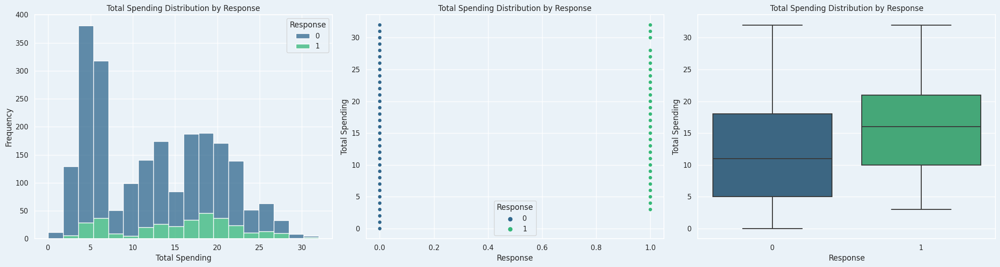

In [48]:
# Set up the matplotlib figure
fig, axes = plt.subplots(1, 3, figsize=(22, 6))

# Histogram
sns.histplot(data=data, x="TotalSpending", hue="Response", palette="viridis", ax=axes[0], multiple="stack")
axes[0].set_title("Total Spending Distribution by Response")
axes[0].set_xlabel("Total Spending")
axes[0].set_ylabel("Frequency")

# Scatter Plot
sns.scatterplot(x="Response", y="TotalSpending", data=data, hue="Response", palette="viridis", ax=axes[1])
axes[1].set_title("Total Spending Distribution by Response")
axes[1].set_xlabel("Response")
axes[1].set_ylabel("Total Spending")

# Box Plot
sns.boxplot(x="Response", y="TotalSpending", data=data, palette="viridis", ax=axes[2])
axes[2].set_title("Total Spending Distribution by Response")
axes[2].set_xlabel("Response")
axes[2].set_ylabel("Total Spending")

# Adjust layout
plt.tight_layout()
plt.show()

## <b><span style='color:#08306B'>11) How do AcceptedCmp1, AcceptedCmp2, etc. relate to TotalSpending?</span> </b>

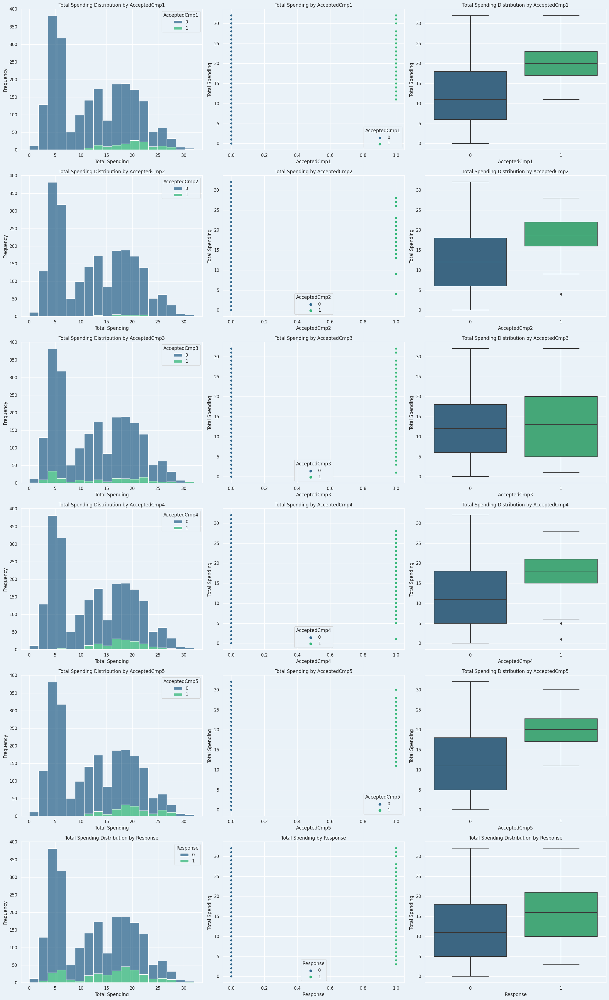

In [49]:
# Create figure and axes
fig, axes = plt.subplots(6, 3, figsize=(22, 36))

# List of campaigns and their corresponding axes index
campaigns = ["AcceptedCmp1", "AcceptedCmp2", "AcceptedCmp3", "AcceptedCmp4", "AcceptedCmp5", "Response"]
titles = ["AcceptedCmp1", "AcceptedCmp2", "AcceptedCmp3", "AcceptedCmp4", "AcceptedCmp5", "Response"]

for i, campaign in enumerate(campaigns):
    # Histogram
    sns.histplot(data=data, x="TotalSpending", hue=campaign, palette="viridis", ax=axes[i, 0], multiple="stack")
    axes[i, 0].set_title(f"Total Spending Distribution by {titles[i]}")
    axes[i, 0].set_xlabel("Total Spending")
    axes[i, 0].set_ylabel("Frequency")

    # Scatter Plot
    sns.scatterplot(x=campaign, y="TotalSpending", data=data, hue=campaign, palette="viridis", ax=axes[i, 1])
    axes[i, 1].set_title(f"Total Spending by {titles[i]}")
    axes[i, 1].set_xlabel(titles[i])
    axes[i, 1].set_ylabel("Total Spending")

    # Box Plot
    sns.boxplot(x=campaign, y="TotalSpending", data=data, palette="viridis", ax=axes[i, 2])
    axes[i, 2].set_title(f"Total Spending Distribution by {titles[i]}")
    axes[i, 2].set_xlabel(titles[i])
    axes[i, 2].set_ylabel("Total Spending")

# Adjust layout
plt.tight_layout()
plt.show()

## <b><span style='color:#08306B'>12) Is there a correlation between age and total spending?</span> </b>

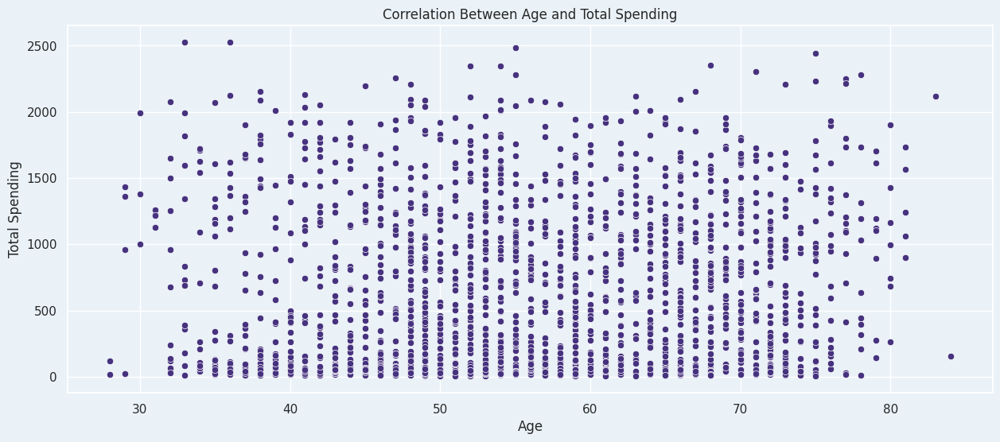

Correlation coefficient between Age and Total Spending: 0.11


In [50]:
# Visualize the correlation between Age and Total Spending
plt.figure(figsize=(15, 6))
sns.scatterplot(x="Age", y="Spent", data=data, palette="Blues")
plt.title("Correlation Between Age and Total Spending")
plt.xlabel("Age")
plt.ylabel("Total Spending")
plt.show()

# Calculate correlation coefficient
correlation = data[["Age", "Spent"]].corr().iloc[0, 1]
print(f"Correlation coefficient between Age and Total Spending: {correlation:.2f}")

## <b><span style='color:#08306B'>13) How does marital status affect spending patterns?</span> </b>


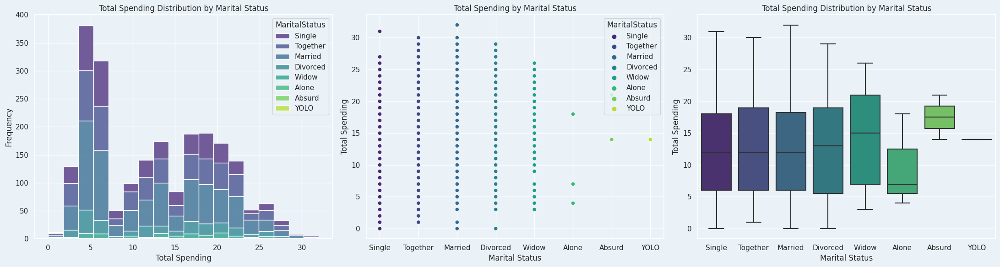

In [51]:
# Set up the matplotlib figure
fig, axes = plt.subplots(1, 3, figsize=(22, 6))

# Histogram
sns.histplot(data=data, x="TotalSpending", hue="MaritalStatus", palette="viridis", ax=axes[0], multiple="stack")
axes[0].set_title("Total Spending Distribution by Marital Status")
axes[0].set_xlabel("Total Spending")
axes[0].set_ylabel("Frequency")

# Scatter Plot
sns.scatterplot(x="MaritalStatus", y="TotalSpending", data=data, hue="MaritalStatus", palette="viridis", ax=axes[1])
axes[1].set_title("Total Spending by Marital Status")
axes[1].set_xlabel("Marital Status")
axes[1].set_ylabel("Total Spending")

# Box Plot
sns.boxplot(x="MaritalStatus", y="TotalSpending", data=data, palette="viridis", ax=axes[2])
axes[2].set_title("Total Spending Distribution by Marital Status")
axes[2].set_xlabel("Marital Status")
axes[2].set_ylabel("Total Spending")

# Adjust layout
plt.tight_layout()
plt.show()

## <b><span style='color:#08306B'>14) How does income relate to spending in different product categories?</span> </b>

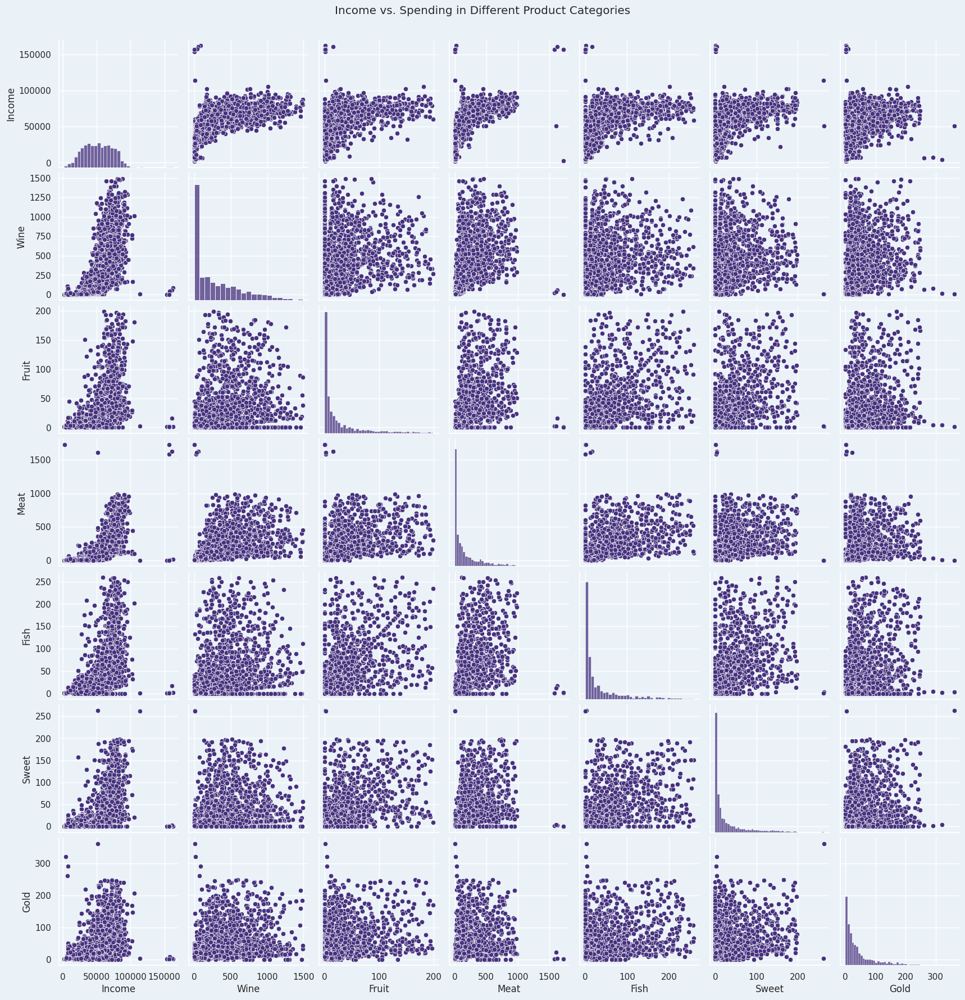

In [52]:
# Pairplot to show the relationship between Income and spending in different product categories
product_categories = ["Wine", "Fruit", "Meat", "Fish", "Sweet", "Gold"]

# Create a DataFrame for Pairplot
data_pairplot = data[["Income"] + product_categories]
sns.pairplot(data_pairplot, kind="scatter", palette="Blues")
plt.suptitle("Income vs. Spending in Different Product Categories", y=1.02)
plt.show()

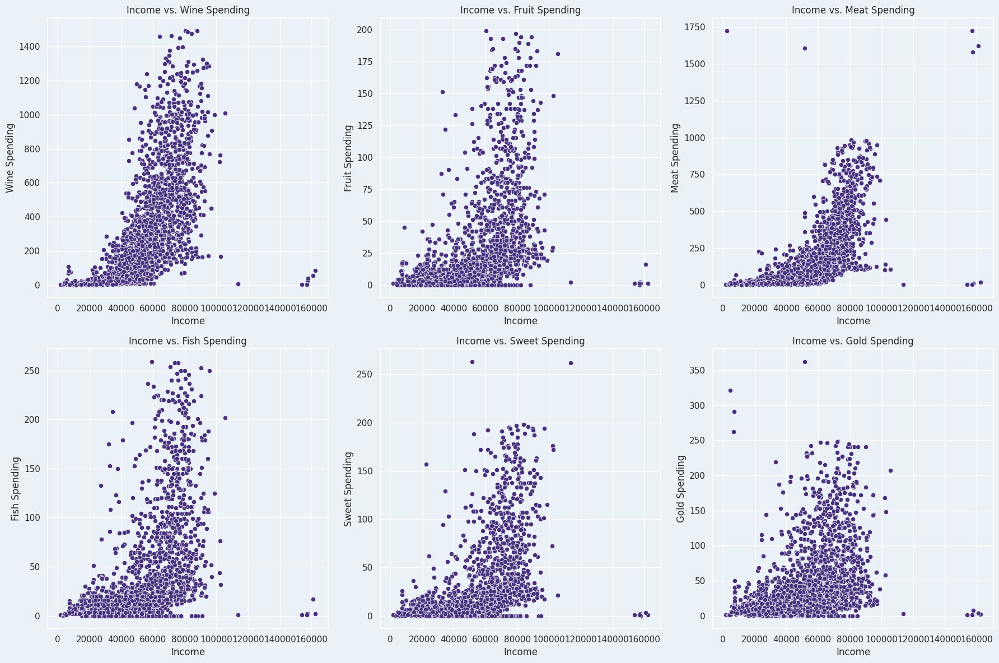

In [53]:
# List of product categories to analyze
product_categories = ["Wine", "Fruit", "Meat", "Fish", "Sweet", "Gold"]

plt.figure(figsize=(18, 12))
for i, category in enumerate(product_categories):
    plt.subplot(2, 3, i + 1)
    sns.scatterplot(x="Income", y=category, data=data, palette="Blues")
    plt.title(f"Income vs. {category} Spending")
    plt.xlabel("Income")
    plt.ylabel(f"{category} Spending")

plt.tight_layout()
plt.show()

## <b><span style='color:#08306B'>15) Is there a correlation between the number of children at home and spending on different product categories?</span> </b>

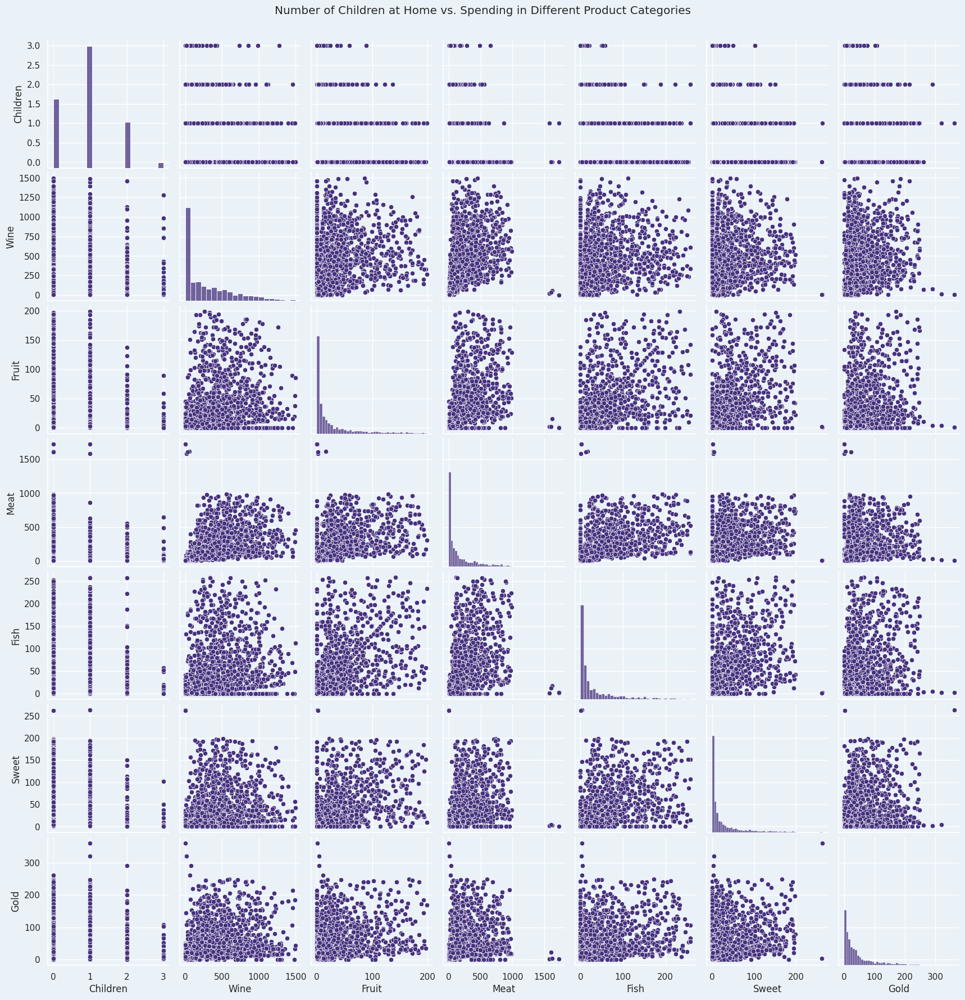

In [54]:
# Create a DataFrame for Pairplot
product_categories = ["Wine", "Fruit", "Meat", "Fish", "Sweet", "Gold"]

data_pairplot = data[["Children"] + product_categories]
sns.pairplot(data_pairplot, kind="scatter", palette="Blues")
plt.suptitle("Number of Children at Home vs. Spending in Different Product Categories", y=1.02)
plt.show()

## <b><span style='color:#08306B'>16) Is there a relationship between education level and response to marketing campaigns?</span> </b>

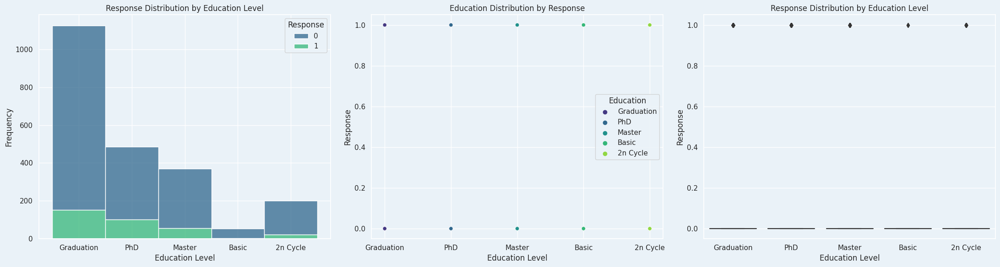

In [55]:
# Set up the matplotlib figure
fig, axes = plt.subplots(1, 3, figsize=(22, 6))

# Histogram (Stacked)
sns.histplot(data=data, x="Education", hue="Response", palette="viridis", ax=axes[0], multiple="stack")
axes[0].set_title("Response Distribution by Education Level")
axes[0].set_xlabel("Education Level")
axes[0].set_ylabel("Frequency")

# Scatter Plot
sns.scatterplot(x="Education", y="Response", data=data, hue="Education", palette="viridis", ax=axes[1])
axes[1].set_title("Education Distribution by Response")
axes[1].set_xlabel("Education Level")
axes[1].set_ylabel("Response")

# Box Plot
sns.boxplot(x="Education", y="Response", data=data, palette="viridis", ax=axes[2])
axes[2].set_title("Response Distribution by Education Level")
axes[2].set_xlabel("Education Level")
axes[2].set_ylabel("Response")

# Adjust layout
plt.tight_layout()
plt.show()

## <b><span style='color:#08306B'>D. Multivariate Exploration</span> </b>

## <b><span style='color:#08306B'>1) How do age, income, and education level jointly influence total spending?

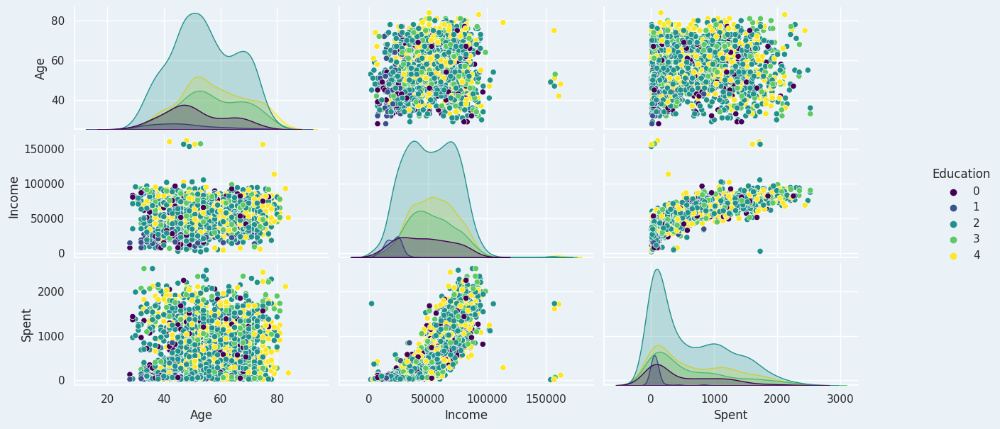

In [56]:
# Assuming data is your DataFrame
data["Education"] = data["Education"].astype("category").cat.codes

# Create a pair plot to visualize the relationship
sns.pairplot(data, vars=[ "Age", "Income", "Spent"], hue="Education", palette="viridis")
plt.gcf().set_size_inches(15, 6)
plt.show()

## <b><span style='color:#08306B'>2) What factors (age, income) best predict the preferred purchasing channel (web, catalog, store)?

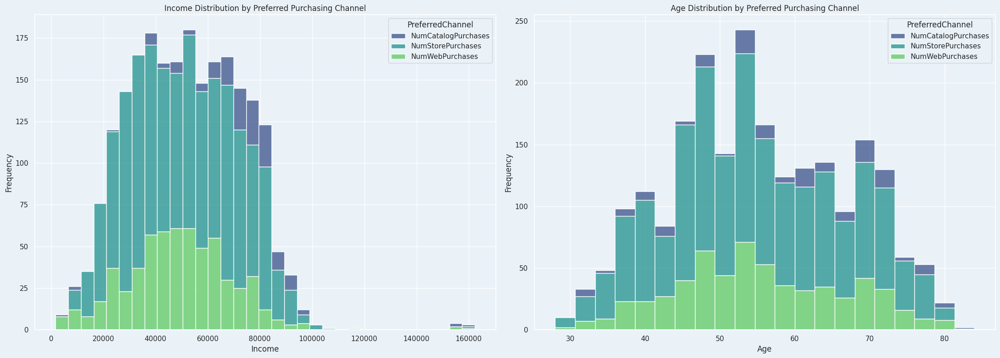

In [57]:
# Prepare data
data["PreferredChannel"] = data[["NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases"]].idxmax(axis=1)
data["PreferredChannel"] = data["PreferredChannel"].astype("category")

# Set up the matplotlib figure
fig, axes = plt.subplots(1, 2, figsize=(22, 8))

# Histogram for Income
sns.histplot(data=data, x="Income", hue="PreferredChannel", palette="viridis", multiple="stack", ax=axes[0])
axes[0].set_title("Income Distribution by Preferred Purchasing Channel")
axes[0].set_xlabel("Income")
axes[0].set_ylabel("Frequency")

# Histogram for Age
sns.histplot(data=data, x="Age", hue="PreferredChannel", palette="viridis", multiple="stack", ax=axes[1])
axes[1].set_title("Age Distribution by Preferred Purchasing Channel")
axes[1].set_xlabel("Age")
axes[1].set_ylabel("Frequency")

# Adjust layout
plt.tight_layout()
plt.show()

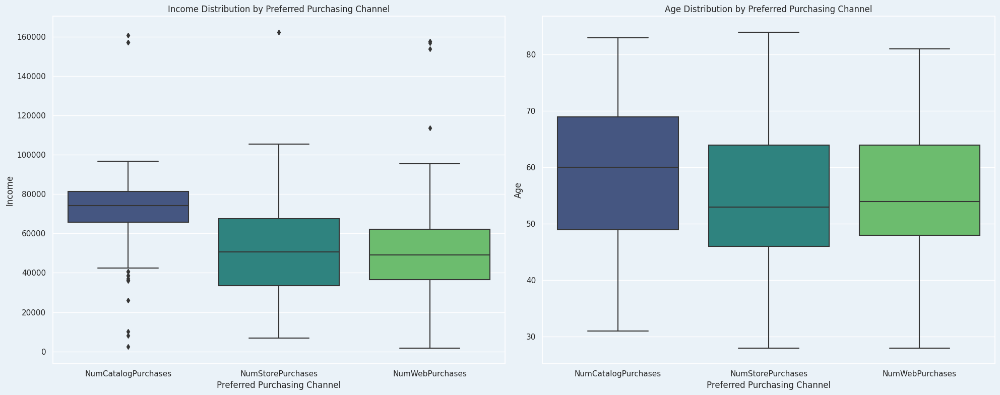

In [58]:
# Prepare data
data["PreferredChannel"] = data[["NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases"]].idxmax(axis=1)
data["PreferredChannel"] = data["PreferredChannel"].astype("category")

# Set up the matplotlib figure
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Box plot for Income
sns.boxplot(x="PreferredChannel", y="Income", data=data, palette="viridis", ax=axes[0])
axes[0].set_title("Income Distribution by Preferred Purchasing Channel")
axes[0].set_xlabel("Preferred Purchasing Channel")
axes[0].set_ylabel("Income")

# Box plot for Age
sns.boxplot(x="PreferredChannel", y="Age", data=data, palette="viridis", ax=axes[1])
axes[1].set_title("Age Distribution by Preferred Purchasing Channel")
axes[1].set_xlabel("Preferred Purchasing Channel")
axes[1].set_ylabel("Age")

# Adjust layout
plt.tight_layout()
plt.show()

In [59]:
# Prepare data
data["PreferredChannel"] = data[["NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases"]].idxmax(axis=1)

# Encode categorical variables
data["PreferredChannel"] = data["PreferredChannel"].astype("category").cat.codes

# Define predictors and target
X = data[["Age", "Income"]]
y = data["PreferredChannel"]

# Add constant to predictors
X = sm.add_constant(X)

# Fit multinomial logistic regression model
model = sm.MNLogit(y, X)
result = model.fit()

print(result.summary())

Optimization terminated successfully.
         Current function value: 0.779413
         Iterations 7
                          MNLogit Regression Results                          
Dep. Variable:       PreferredChannel   No. Observations:                 2236
Model:                        MNLogit   Df Residuals:                     2230
Method:                           MLE   Df Model:                            4
Date:                Sat, 03 Aug 2024   Pseudo R-squ.:                 0.04354
Time:                        17:06:04   Log-Likelihood:                -1742.8
converged:                       True   LL-Null:                       -1822.1
Covariance Type:            nonrobust   LLR p-value:                 2.809e-33
PreferredChannel=1       coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  6.1270      0.535     11.442      0.000       5.077       7.176
Age  

## <b><span style='color:#08306B'>3) How do income, education, and marital status jointly influence the acceptance of different marketing campaigns?</span> </b>

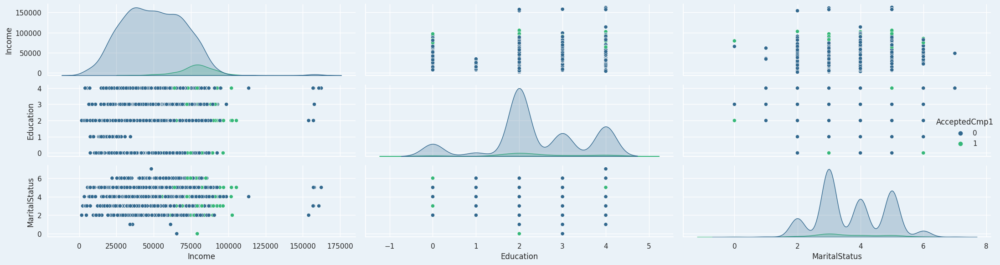

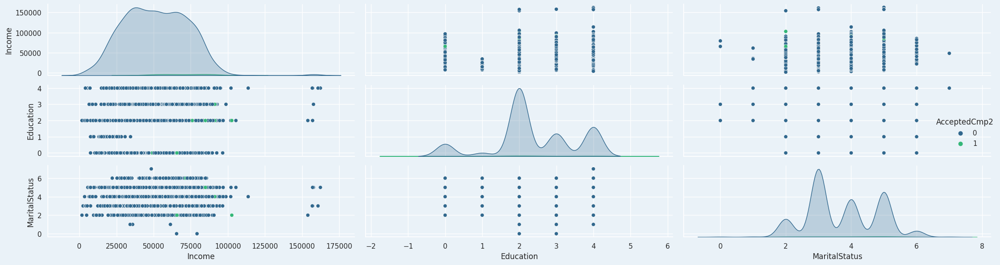

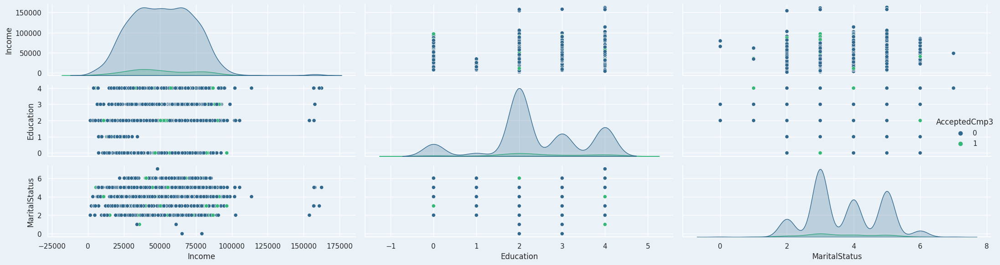

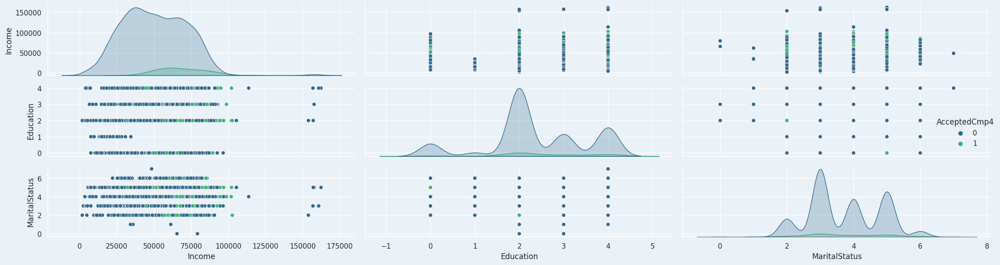

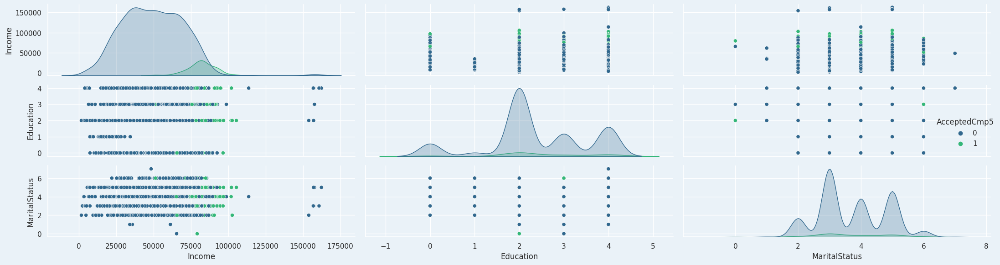

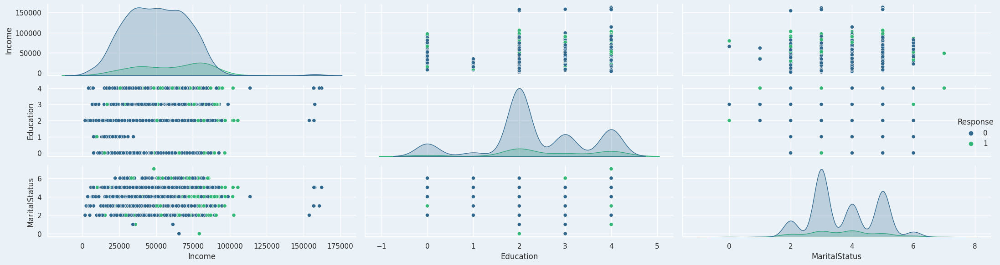

In [60]:
# Prepare data
data["MaritalStatus"] = data["MaritalStatus"].astype("category").cat.codes
data["Education"] = data["Education"].astype("category").cat.codes

# Plot the relationship between predictors and campaign acceptance
for campaign in ["AcceptedCmp1", "AcceptedCmp2", "AcceptedCmp3", "AcceptedCmp4", "AcceptedCmp5", "Response"]:
    sns.pairplot(data, vars=["Income", "Education", "MaritalStatus"], hue=campaign, palette="viridis")
    plt.gcf().set_size_inches(22, 6)
    plt.tight_layout()
    plt.show()

In [61]:
# Prepare data
data["MaritalStatus"] = data["MaritalStatus"].astype("category").cat.codes
data["Education"] = data["Education"].astype("category").cat.codes

# Define predictors and targets for each campaign
campaigns = ["AcceptedCmp1", "AcceptedCmp2", "AcceptedCmp3", "AcceptedCmp4", "AcceptedCmp5", "Response"]
for campaign in campaigns:
    X = data[["Income", "Education", "MaritalStatus"]]
    y = data[campaign]
    
    # Add constant to predictors
    X = sm.add_constant(X)
    
    # Fit logistic regression model
    model = sm.Logit(y, X)
    result = model.fit()
    
    print(f"Results for {campaign}:")
    print(result.summary())
    print("\n")

Optimization terminated successfully.
         Current function value: 0.184085
         Iterations 8
Results for AcceptedCmp1:
                           Logit Regression Results                           
Dep. Variable:           AcceptedCmp1   No. Observations:                 2236
Model:                          Logit   Df Residuals:                     2232
Method:                           MLE   Df Model:                            3
Date:                Sat, 03 Aug 2024   Pseudo R-squ.:                  0.2295
Time:                        17:06:45   Log-Likelihood:                -411.61
converged:                       True   LL-Null:                       -534.20
Covariance Type:            nonrobust   LLR p-value:                 7.252e-53
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -6.7798      0.583    -11.627      0.000      -7.923      -

## <b><span style='color:#08306B'>4) What is the relationship between the number of web visits, catalog purchases, and store purchases in determining total customer spend?
</span> </b>

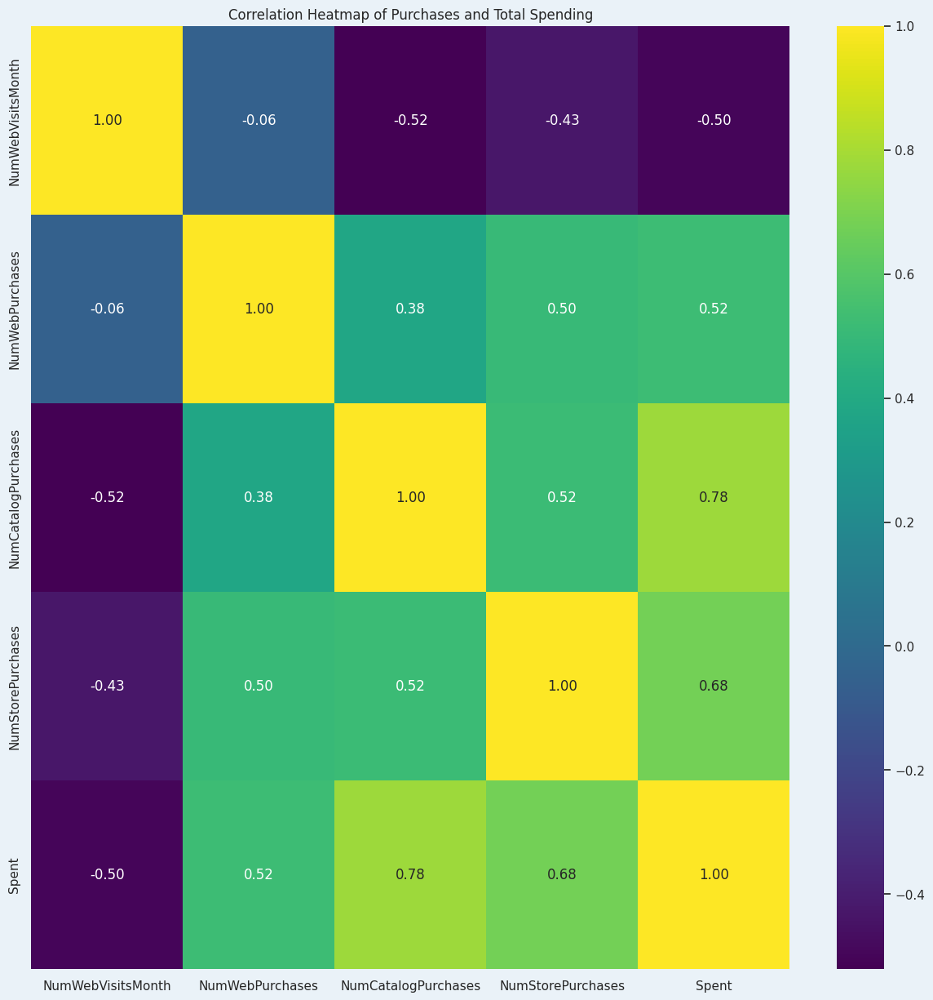

In [62]:
# Calculate correlations
correlations = data[["NumWebVisitsMonth", "NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases", "Spent"]].corr()

# Plot the heatmap
plt.figure(figsize=(15, 15))
sns.heatmap(correlations, annot=True, cmap="viridis", fmt=".2f")
plt.title("Correlation Heatmap of Purchases and Total Spending")
plt.show()

## <b><span style='color:#08306B'>5) How do age, income, and presence of children/teenagers affect spending across different product categories?</span> </b>

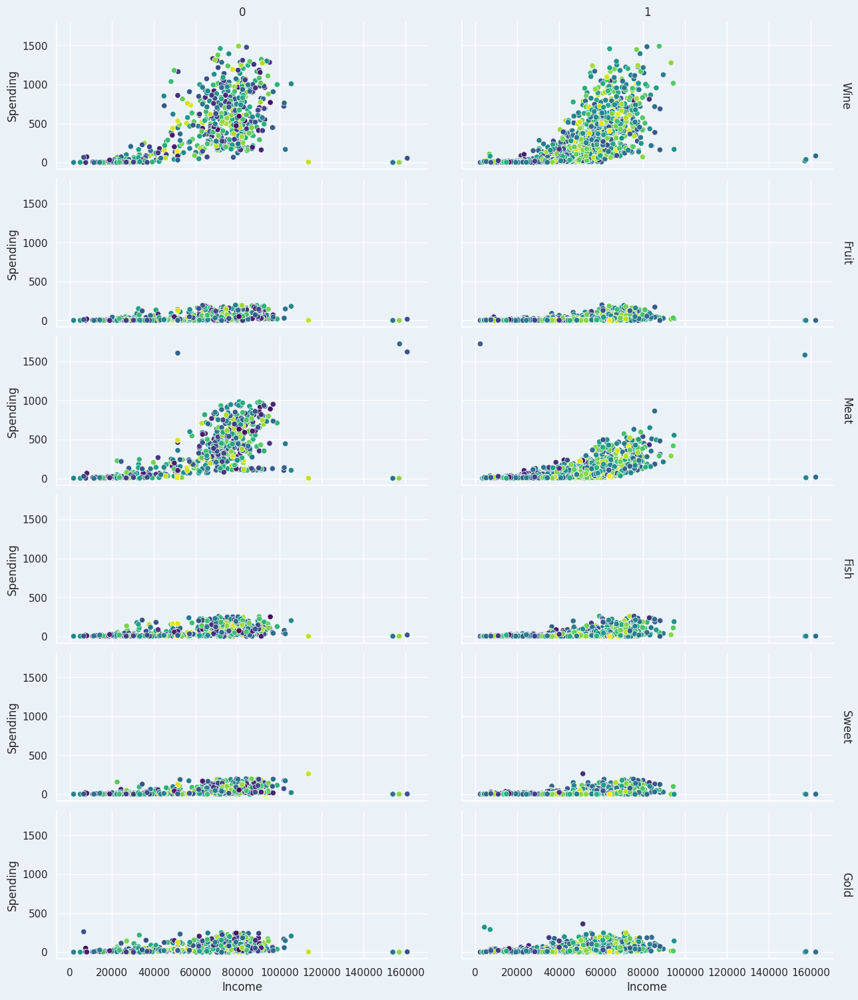

In [63]:
# Convert categorical variables to category type if needed
data["IsParent"] = data["IsParent"].astype("category")

# Melt DataFrame for easier plotting
data_melted = data.melt(id_vars=["Age", "Income", "IsParent"], 
                        value_vars=["Wine", "Fruit", "Meat", "Fish", "Sweet", "Gold"], 
                        var_name="ProductCategory", 
                        value_name="Spending")

# Plot using facet grid
g = sns.FacetGrid(data_melted, col="IsParent", row="ProductCategory", margin_titles=True)
g.map_dataframe(sns.scatterplot, x="Income", y="Spending", hue="Age", palette="viridis")
g.set_axis_labels("Income", "Spending")
g.set_titles(col_template="{col_name}", row_template="{row_name}")
plt.gcf().set_size_inches(15, 15)
plt.show()

## <b><span style='color:#08306B'>6) How do customer demographics (age, income, education) and purchasing behavior (recency, purchase, spent) jointly influence response to the latest campaign?</span> </b>

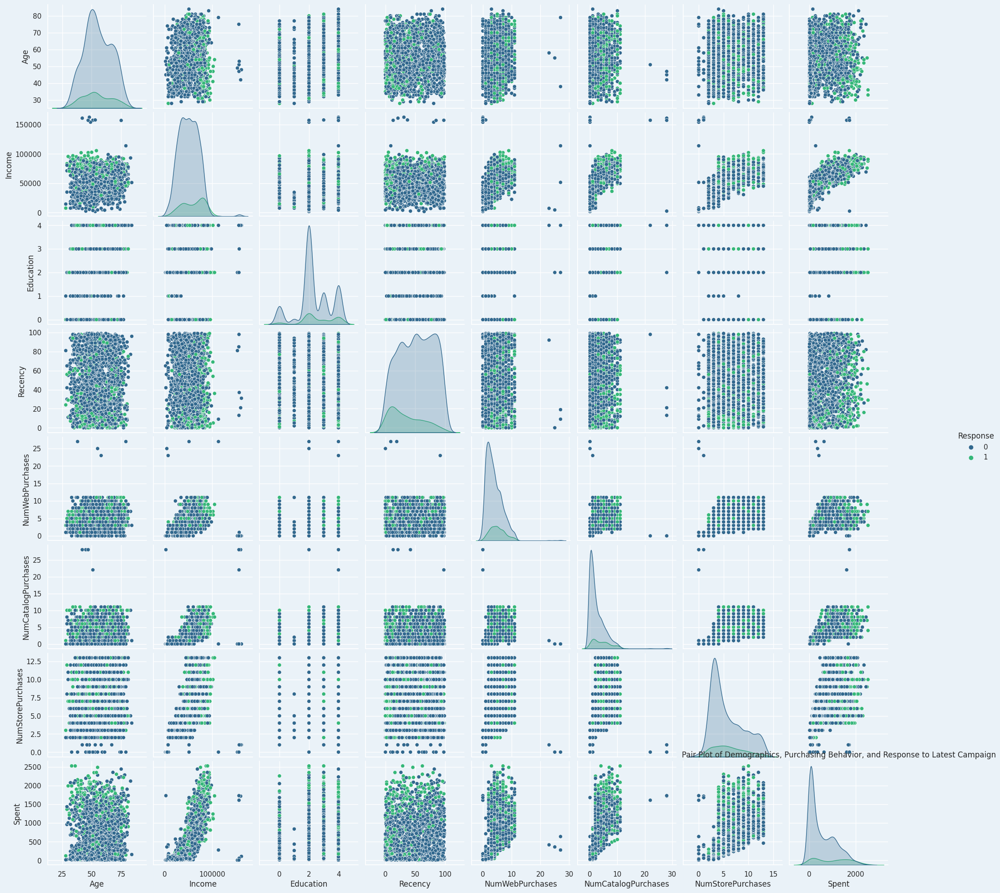

In [64]:
# Prepare data for latest campaign
latest_campaign = "Response"  # Adjust if needed
data["Education"] = data["Education"].astype("category").cat.codes

# Create a pair plot to visualize the relationship
sns.pairplot(data, vars=["Age", "Income", "Education", "Recency", "NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases", "Spent"], hue=latest_campaign, palette="viridis")
plt.title("Pair Plot of Demographics, Purchasing Behavior, and Response to Latest Campaign")
plt.show()

In [65]:
# Prepare data
data["Education"] = data["Education"].astype("category").cat.codes
data["Recency"] = data["Recency"]
data["NumWebPurchases"] = data["NumWebPurchases"]
data["NumCatalogPurchases"] = data["NumCatalogPurchases"]
data["NumStorePurchases"] = data["NumStorePurchases"]
data["Spent"] = data["Spent"]
data["Response"] = data["Response"]

# Define predictors and target
X = data[["Age", "Income", "Education", "Recency", "NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases", "Spent"]]
y = data["Response"]

# Add constant to predictors
X = sm.add_constant(X)

# Fit logistic regression model
model = sm.Logit(y, X)
result = model.fit()

print(result.summary())


Optimization terminated successfully.
         Current function value: 0.344645
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:               Response   No. Observations:                 2236
Model:                          Logit   Df Residuals:                     2227
Method:                           MLE   Df Model:                            8
Date:                Sat, 03 Aug 2024   Pseudo R-squ.:                  0.1826
Time:                        17:07:38   Log-Likelihood:                -770.63
converged:                       True   LL-Null:                       -942.75
Covariance Type:            nonrobust   LLR p-value:                 1.538e-69
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  -0.6125      0.371     -1.649      0.099      -1.341       0.116
Ag

## <b><span style='color:#08306B'>7) What is the relationship total spending, and the likelihood of making purchases with deals?</span> </b>

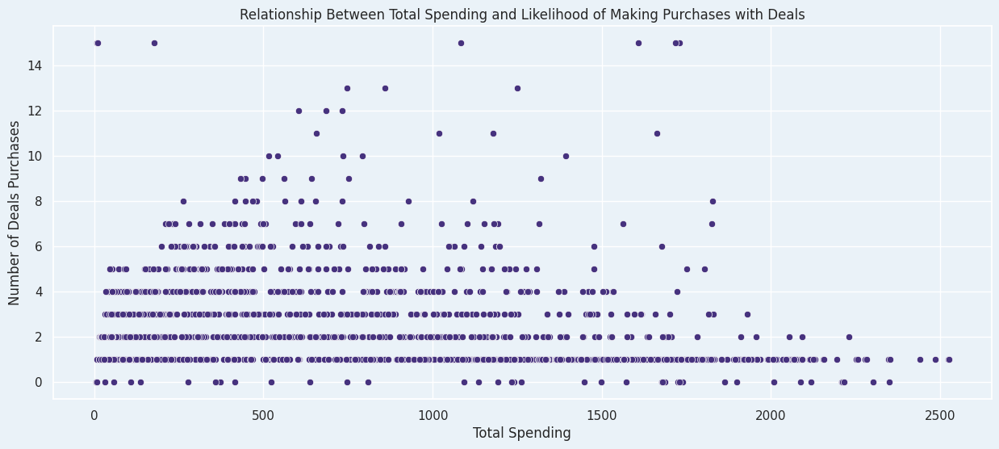

In [66]:
# Plot the relationship between total spending and likelihood of making purchases with deals
plt.figure(figsize=(15, 6))
sns.scatterplot(x="Spent", y="NumDealsPurchases", data=data, palette="viridis")
plt.title("Relationship Between Total Spending and Likelihood of Making Purchases with Deals")
plt.xlabel("Total Spending")
plt.ylabel("Number of Deals Purchases")
plt.show()